<a href="https://colab.research.google.com/github/javiervz/network_science/blob/master/graphs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**A crash course on Graph Theory :)**

## 1. **Basic definitions!** nodes, edges, neighborhoods!

An (undirected) graph $G=(V,E)$ is a pair completely defined by:

1. the set of **nodes** $V\neq \emptyset$
2. the set of **edges** $E \subseteq V\times V$ 

We denote $|V|=n$ and $|E|=m$. 

**Question 1:** Determine the number of edges if there is an edge for every pair of nodes of the graph $G$ 

The **density** of a **graph** $G$ is $$\frac{2m}{n(n-1)}$$

Explain both parts of the fraction: $2m$ and $n(n-1)$.

In [1]:
## important libraries!!!
import networkx as nx
import matplotlib.pyplot as plt
import random

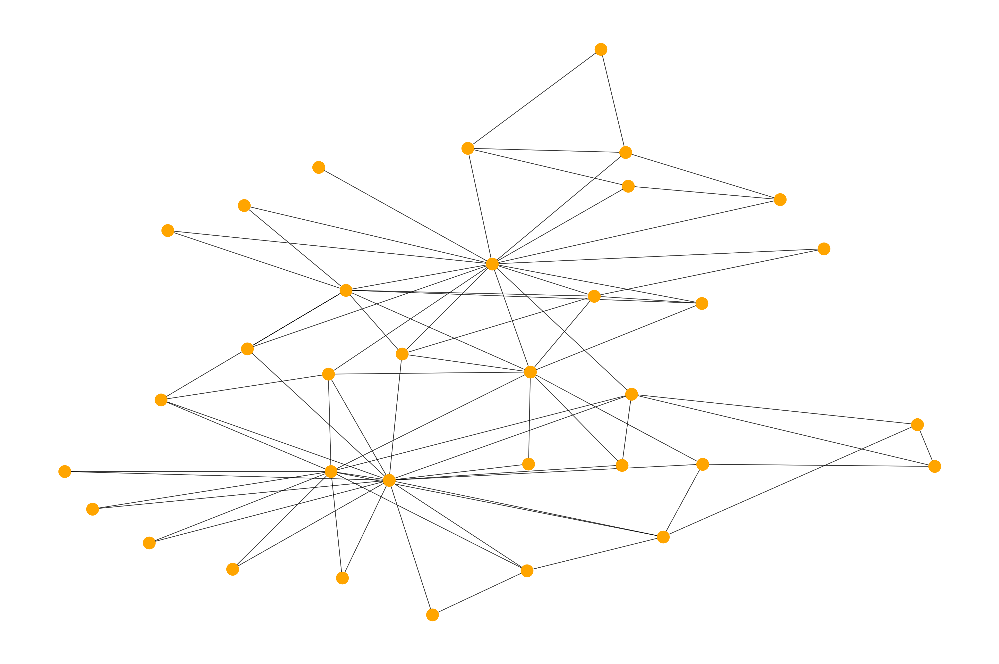

In [3]:
## an example
## https://en.wikipedia.org/wiki/Zachary%27s_karate_club

G = nx.karate_club_graph()

## visualization
fig, ax = plt.subplots(dpi=800)
pos = nx.kamada_kawai_layout(G)
nx.draw_networkx_nodes(G, pos, node_size = 12, node_color='orange') 
nx.draw_networkx_edges(G, pos, alpha=0.75,width=0.25,edge_color='k')
plt.axis('off')
plt.show()

In [4]:
density=nx.density(G)

In [5]:
density

0.13903743315508021

A graph of **density** 1 is said to be **complete**, denoted as $K_n$ ($n$ is the number of nodes). How many edges has a **complete graph?** Questions about **nodes** or **groups of nodes?**

In [6]:
def plot_graph(G):
    fig, ax = plt.subplots(dpi=800)
    pos = nx.spring_layout(G)
    labels={i:i for i in G.nodes}
    nx.draw_networkx_nodes(G, pos, node_size = 200, node_color='orange') 
    nx.draw_networkx_edges(G, pos, alpha=1.,width=0.5,edge_color='k')
    nx.draw_networkx_labels(G,pos,labels,alpha=0.95,font_size=15,font_color='k')
    plt.axis('off')
    plt.show()

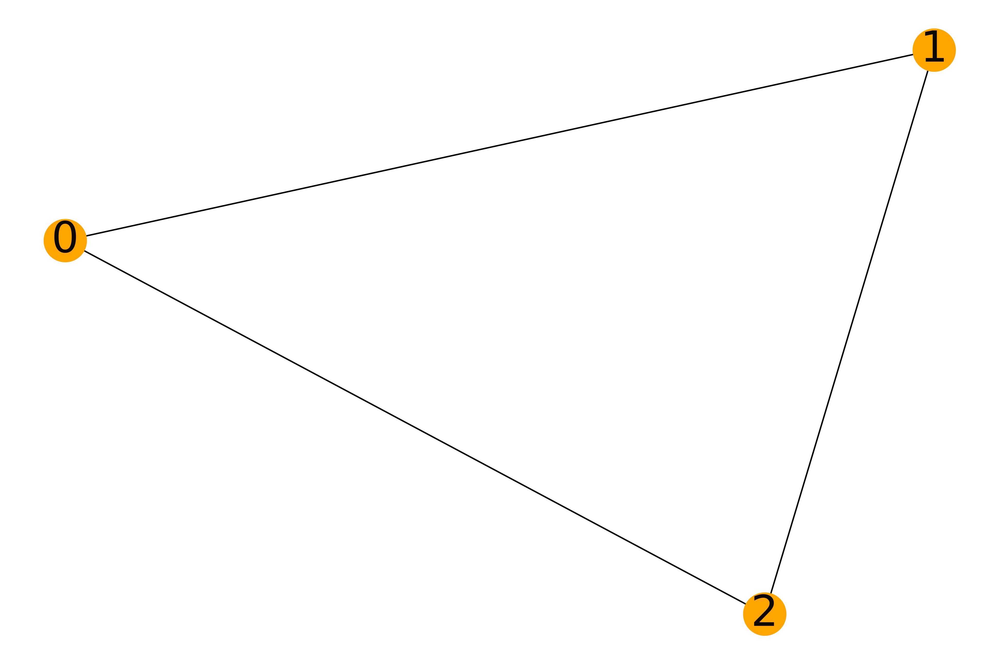

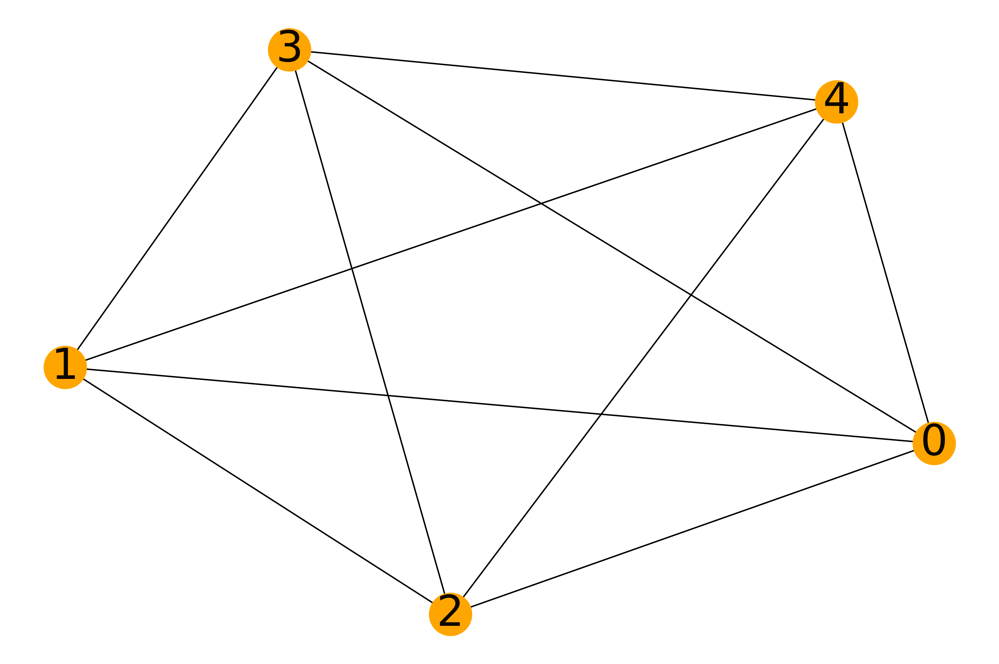

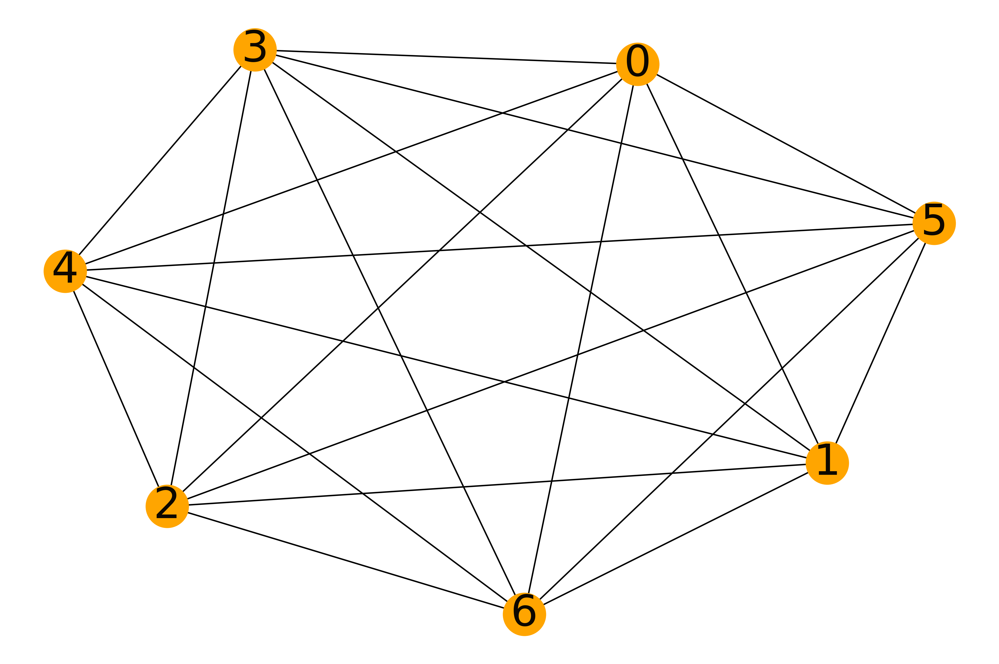

In [7]:
## complete graphs!!!
for k in [3,5,7]:
    Kn=nx.complete_graph(k)
    plot_graph(Kn)

**Question 2:** How many complete graphs of $n$ nodes we can define?

Two graphs $G=(V,E)$ and $G'=(V',E')$, with $|V|=|V'|$, are said to be  **isomorphic** if there is a bijection $\phi: V \rightarrow V'$ such that if $(u,v) \in V$ iff $(\phi(u),\phi(v))
\in V'$. 

---



Two small graphs $G_1$ and $G_2$. Solution: $1\rightarrow 1$, $2 \rightarrow 2$, $4 \rightarrow 3$, $3 \rightarrow 4$

In [8]:
G1=nx.Graph()
G2=nx.Graph()

In [9]:
G1.add_edge(1,2)
G1.add_edge(2,3)
G1.add_edge(3,4)
G1.add_edge(4,1)

In [10]:
G2.add_edge(1,2)
G2.add_edge(2,4)
G2.add_edge(4,3)
G2.add_edge(3,1)

In [11]:
G1.edges(data=True)

EdgeDataView([(1, 2, {}), (1, 4, {}), (2, 3, {}), (3, 4, {})])

In [12]:
G2.edges(data=True)

EdgeDataView([(1, 2, {}), (1, 3, {}), (2, 4, {}), (4, 3, {})])

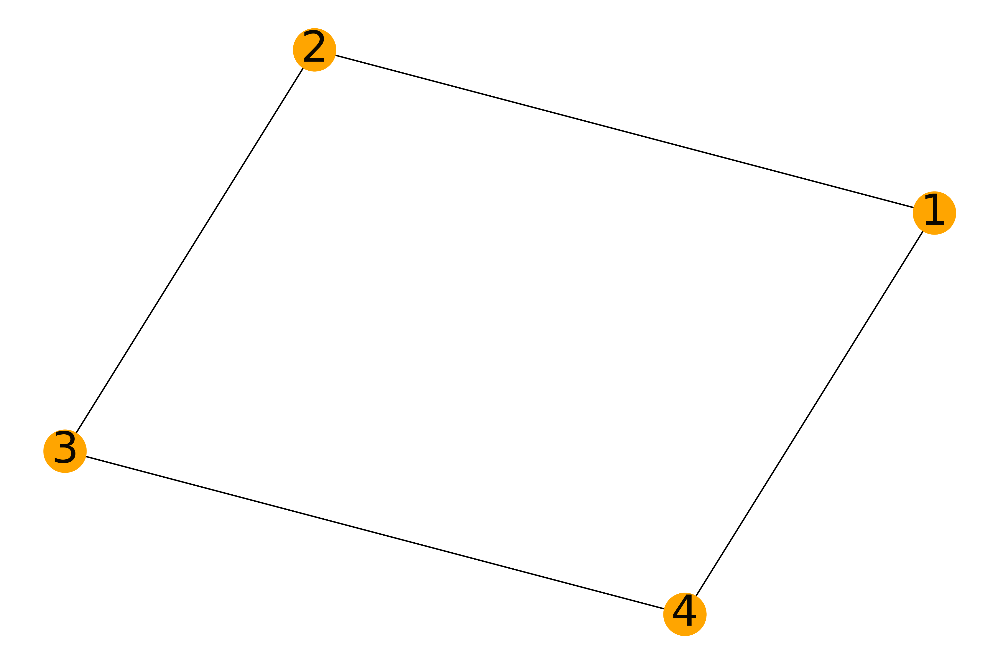

In [13]:
plot_graph(G1)

    

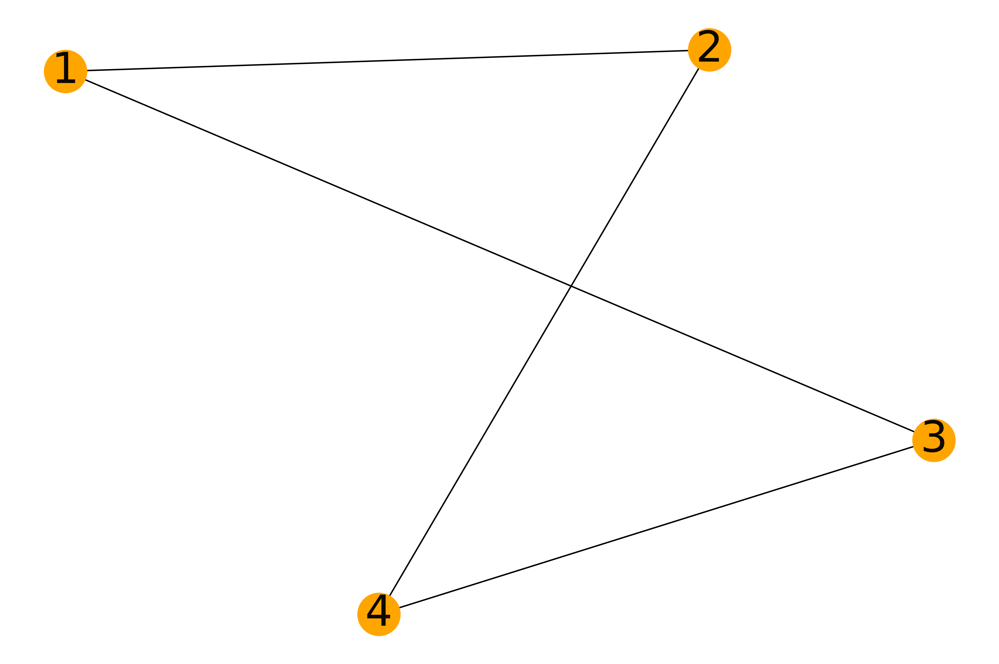

In [14]:
plot_graph(G2)

**Question 3:** Determine if $G_1$ and $G_2$ are isomorphic.  

Consider:

1. $G=(V,E)$.
2. a subset $V'\subseteq V$

Then, the **subgraph induced** by $V'$ is the pair $G'=(V',E')$, where $E'$ contains all links of $G$ that join nodes in $V'$. 

In [25]:
H = G1.subgraph([2,4])

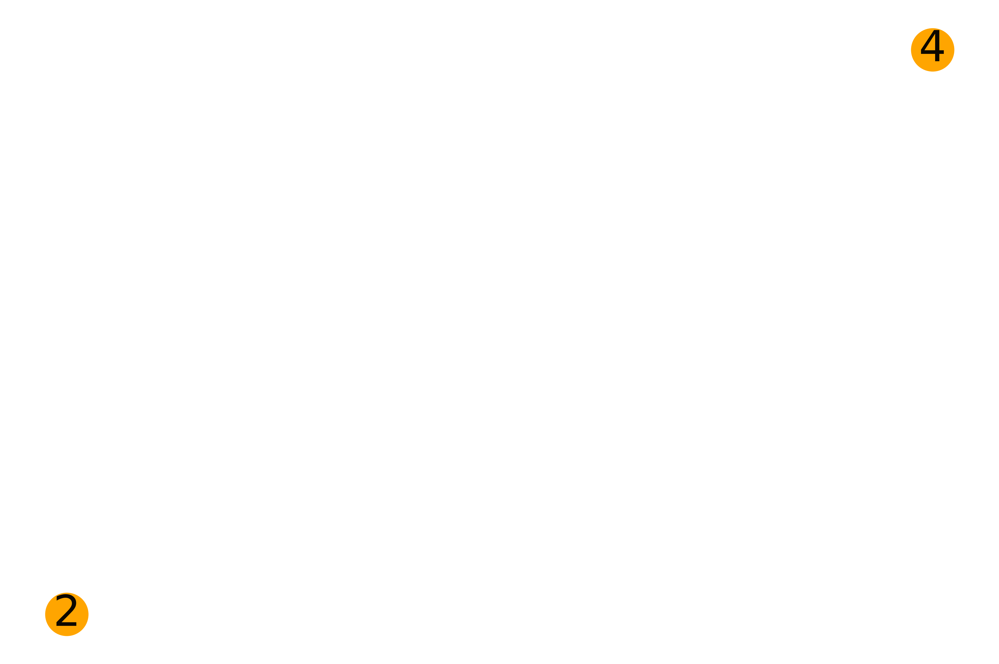

In [26]:
plot_graph(H)

**Question 4:** Consider the complete graph $K_4$. Determine the subgraph induced by any three-node combination. 

In [34]:
K4=nx.complete_graph(4)

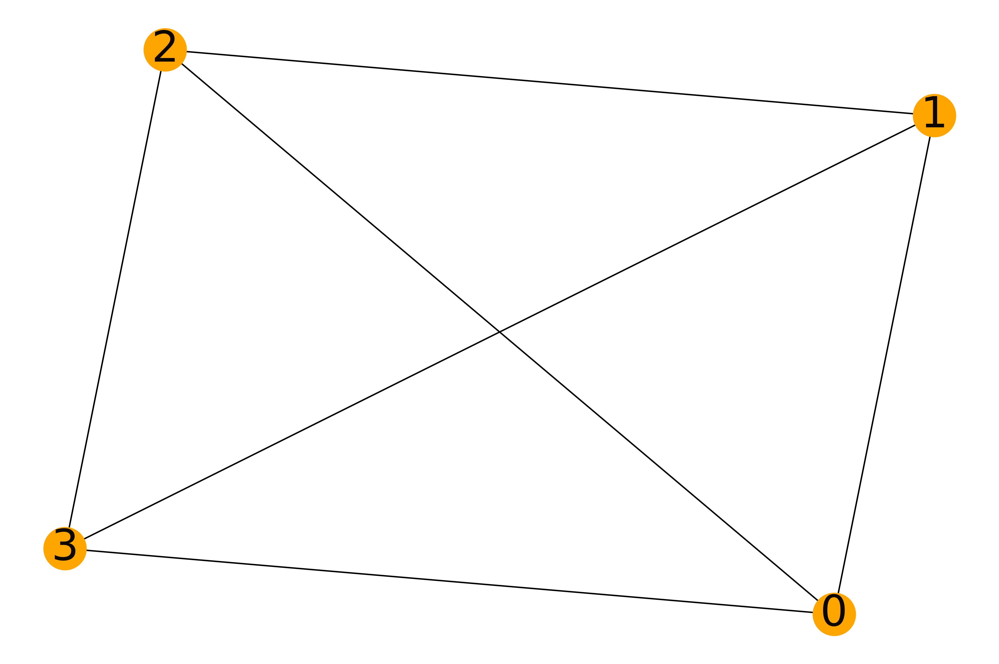

In [35]:
plot_graph(K4)

In [36]:
## remove node 1
K4.remove_node(0)

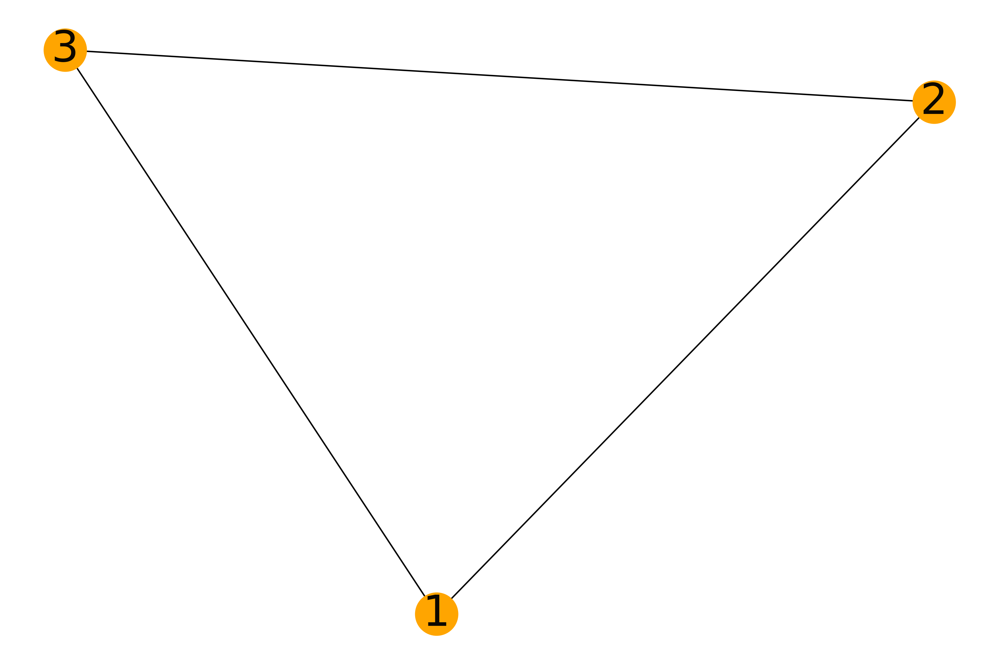

In [37]:
plot_graph(K4)

In [38]:
## again K4
K4=nx.complete_graph(4)

In [39]:
## subgraph induced by [1,2,3]
S=K4.subgraph([1,2,3])

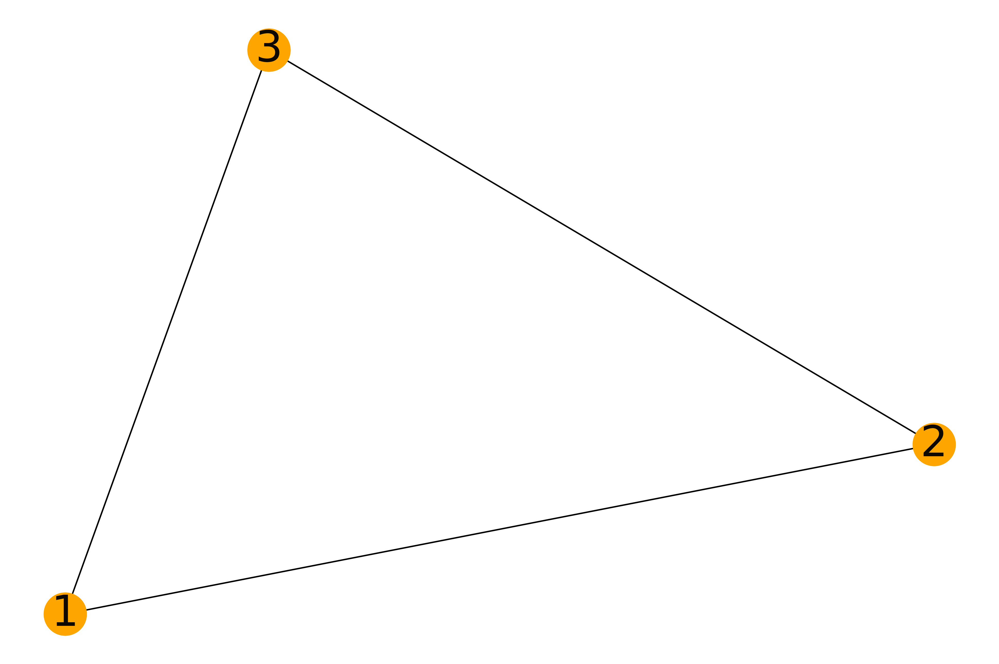

In [40]:
plot_graph(S)

**Question 5:** Remove iteratively nodes in order to increase density of graph G = nx.karate_club_graph()


density=0.13903743315508021


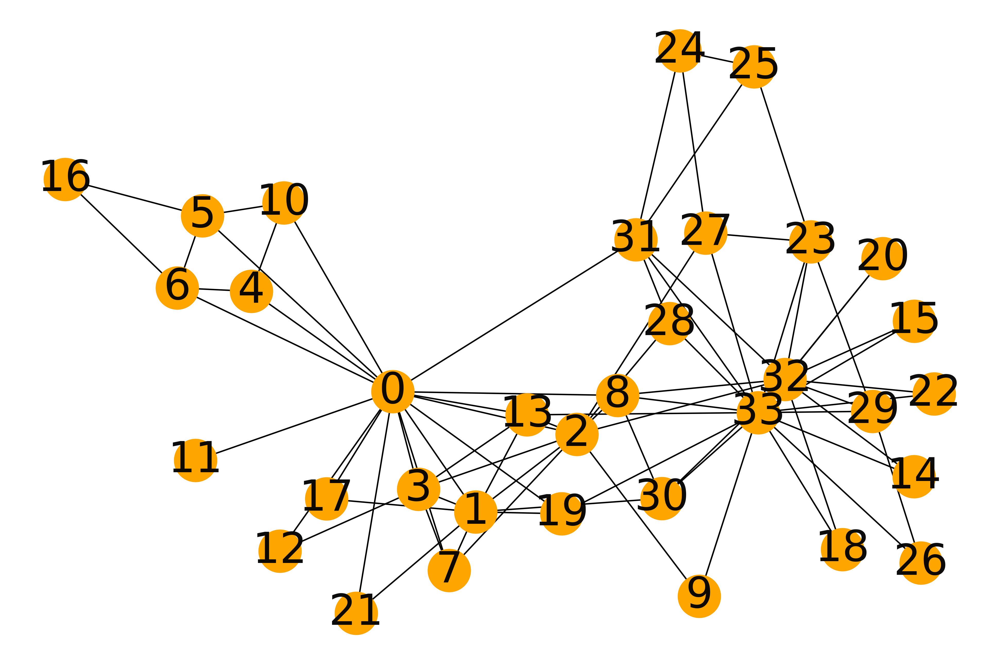

removed node: 17 density=0.14545454545454545


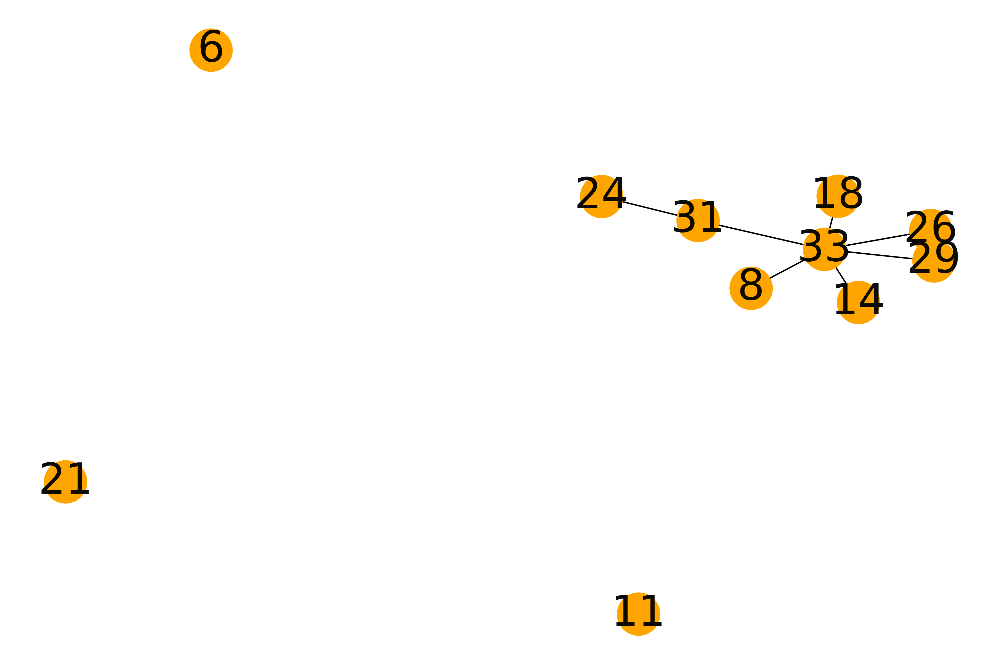

removed node: 11 density=0.17777777777777778


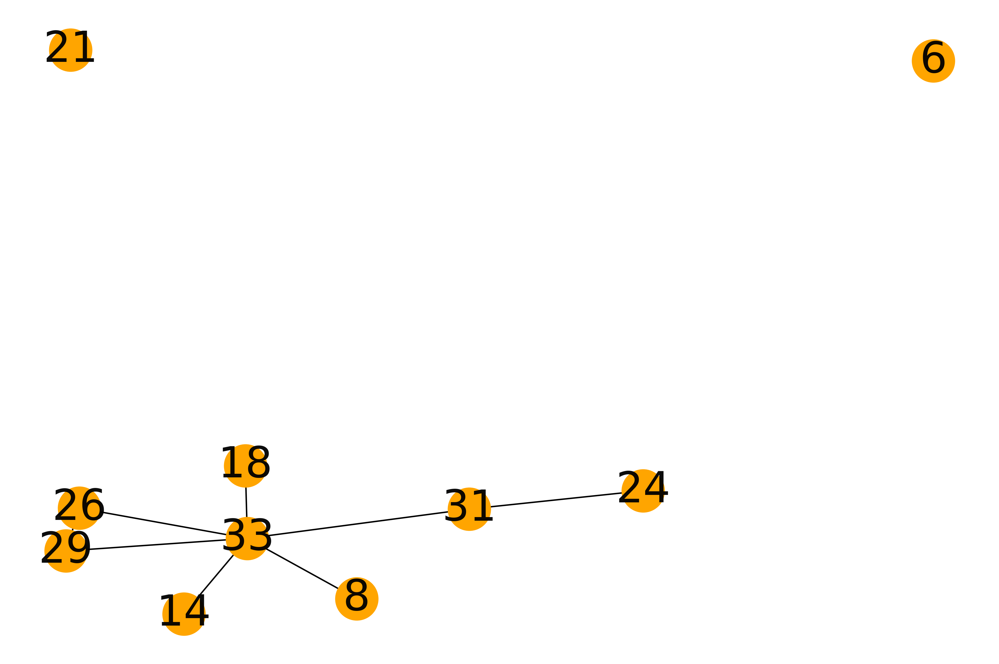

removed node: 14 density=0.17857142857142858


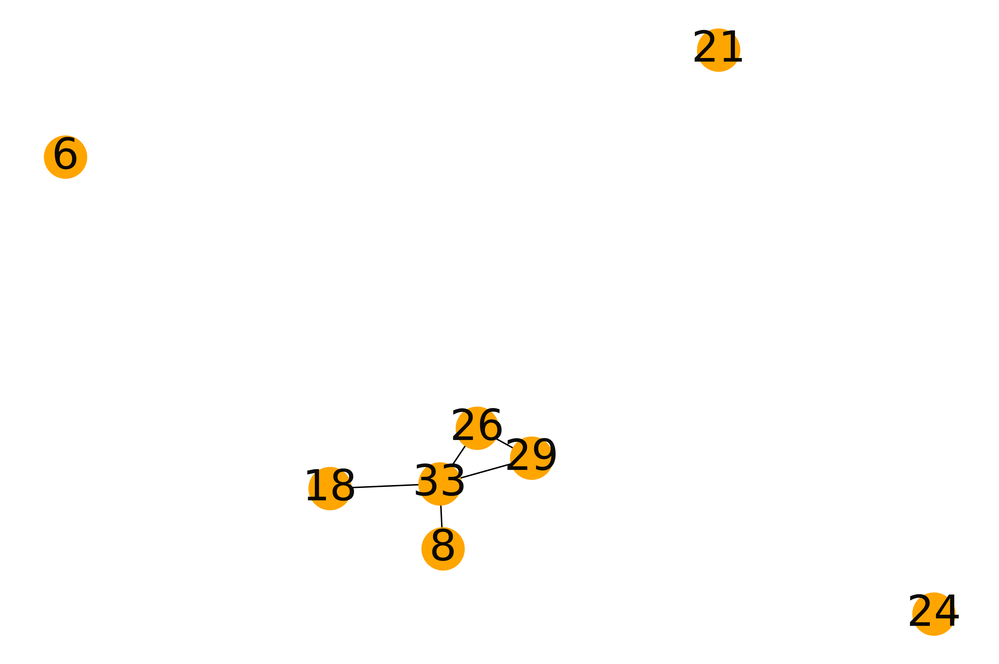

removed node: 8 density=0.19047619047619047


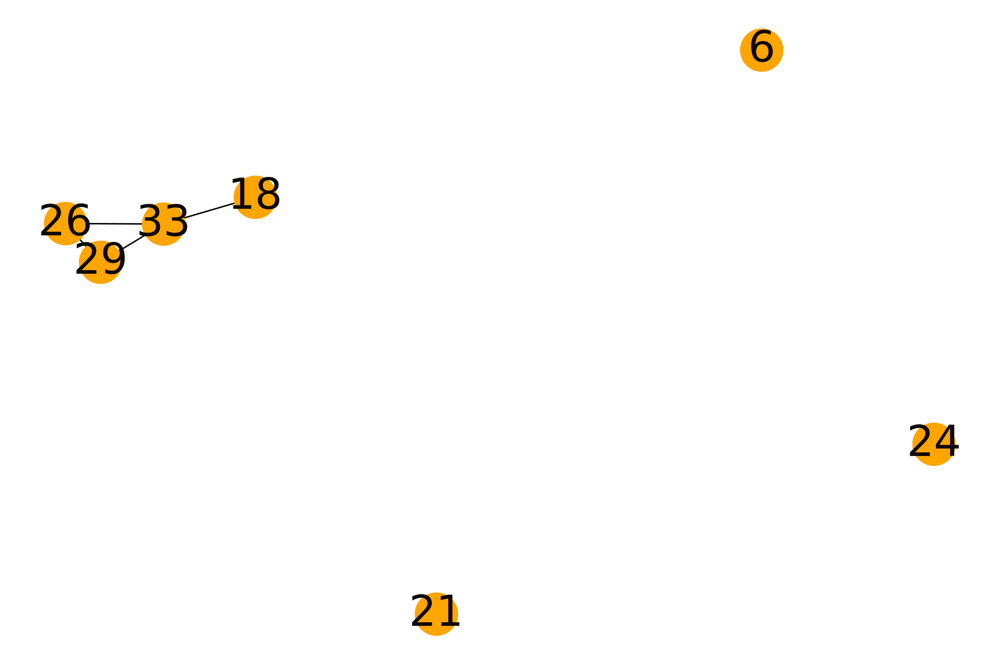

removed node: 21 density=0.26666666666666666


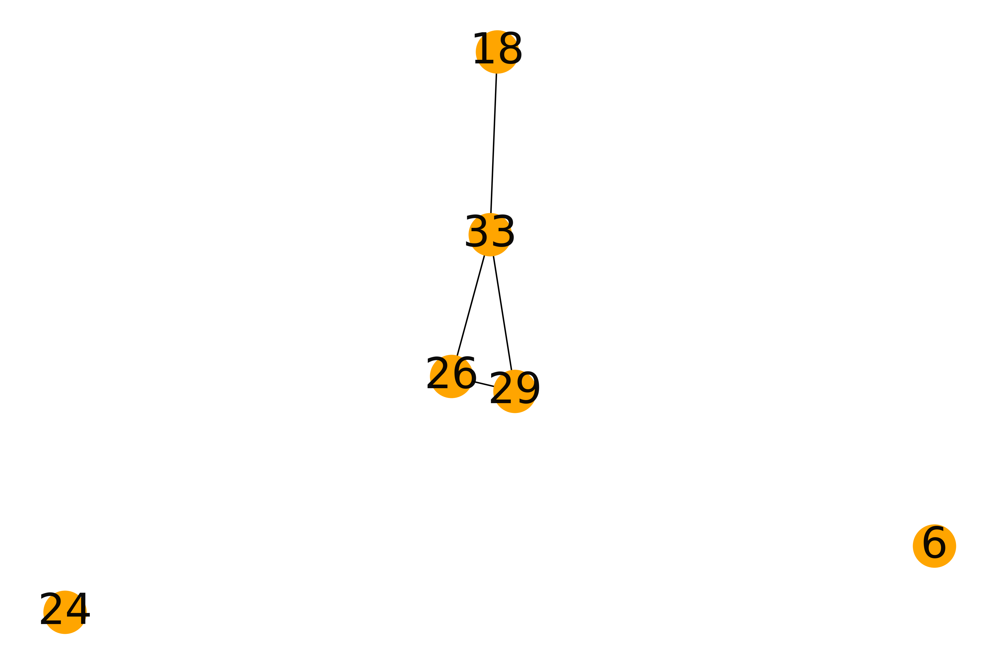

removed node: 6 density=0.3333333333333333


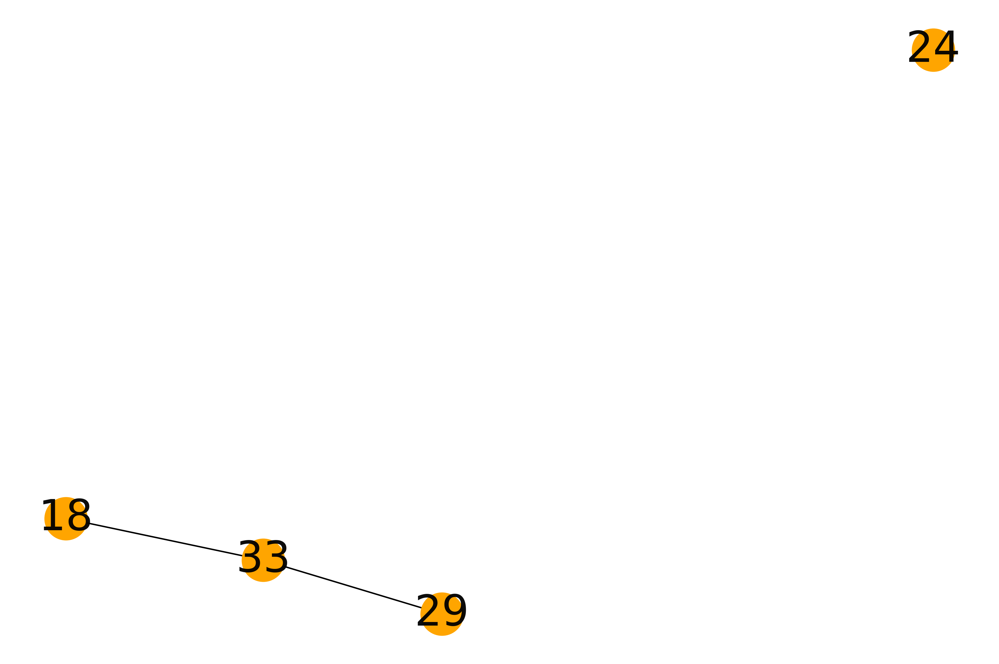

removed node: 24 density=1.0


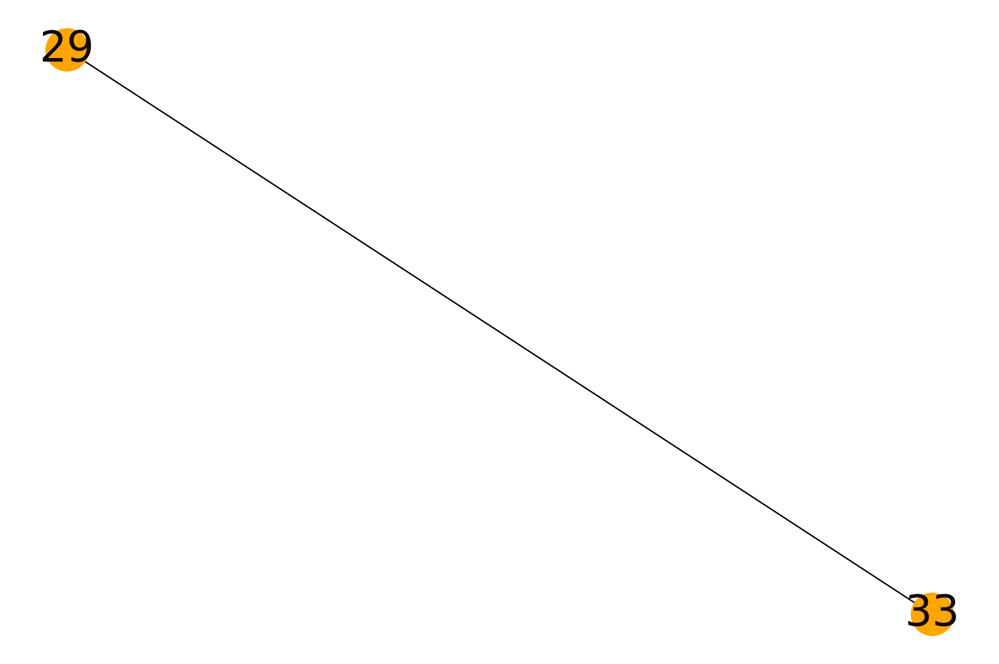

In [41]:
G = nx.karate_club_graph()
density=nx.density(G)
print('density='+str(density))
plot_graph(G)

while len(G)>0:
    node=random.choice(list(G.nodes))
    G.remove_node(node)
    density_remove=nx.density(G)
    if density_remove>density:
        print('removed node: '+str(node)+' '+'density='+str(density_remove))
        density=density_remove
        plot_graph(G)
  

Consider a graph $G=(V,E)$. The **neighborhood** of a node $u \in V$ is defined as 

$$
V_u=\{v\in V: (u,v)\in E\}
$$ 

In [44]:
## example!

G = nx.karate_club_graph()
G.nodes()

NodeView((0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33))

In [45]:
G[0]

AtlasView({1: {}, 2: {}, 3: {}, 4: {}, 5: {}, 6: {}, 7: {}, 8: {}, 10: {}, 11: {}, 12: {}, 13: {}, 17: {}, 19: {}, 21: {}, 31: {}})

In [46]:
[n for n in G.neighbors(0)]

[1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 17, 19, 21, 31]

In [47]:
## number of neighbors!

for node in G.nodes():
    print(node,len([n for n in G.neighbors(node)]))

0 16
1 9
2 10
3 6
4 3
5 4
6 4
7 4
8 5
9 2
10 3
11 1
12 2
13 5
14 2
15 2
16 2
17 2
18 2
19 3
20 2
21 2
22 2
23 5
24 3
25 3
26 2
27 4
28 3
29 4
30 4
31 6
32 12
33 17


**Question 6:**

1. Represent a **chessboard** as a graph $C$
2. Define **different types** of neighborhoods in $C$
3. How to define a neighborhood of radius $r$?

In [52]:
## grid graph!
grid=nx.grid_graph([2,3], periodic=True)

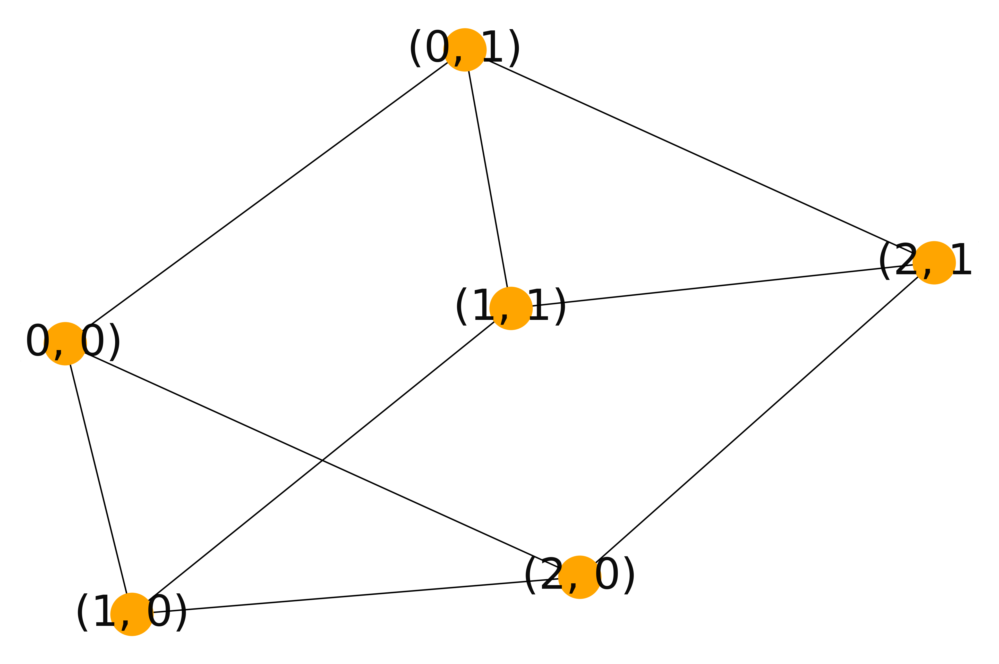

In [53]:
plot_graph(grid)

**Question 7:** What is the meaning of periodic=True?

A **weighted** graph $G = (V,E,W)$ associated a number from $W$ (the weight) to each edge of $E$. What is the **meaning** of a **weighted edge?**

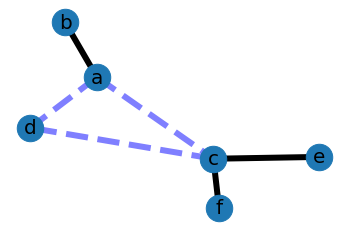

In [54]:
## https://networkx.github.io/documentation/stable/auto_examples/drawing/plot_weighted_graph.html#sphx-glr-auto-examples-drawing-plot-weighted-graph-py
G = nx.Graph()

G.add_edge("a", "b", weight=0.6)
G.add_edge("a", "c", weight=0.2)
G.add_edge("c", "d", weight=0.1)
G.add_edge("c", "e", weight=0.7)
G.add_edge("c", "f", weight=0.9)
G.add_edge("a", "d", weight=0.3)

elarge = [(u, v) for (u, v, d) in G.edges(data=True) if d["weight"] > 0.5]
esmall = [(u, v) for (u, v, d) in G.edges(data=True) if d["weight"] <= 0.5]

pos = nx.spring_layout(G)  # positions for all nodes

# nodes
nx.draw_networkx_nodes(G, pos, node_size=700)

# edges
nx.draw_networkx_edges(G, pos, edgelist=elarge, width=6)
nx.draw_networkx_edges(G, pos, edgelist=esmall, width=6, alpha=0.5, edge_color="b", style="dashed")

# labels
nx.draw_networkx_labels(G, pos, font_size=20, font_family="sans-serif")

plt.axis("off")
plt.show()

## 2. **Directed (versus undirected) graphs!!!**

A **directed** graph $G=(V,E)$ is a pair formed by a set of nodes $V$ and an ordered set of edges $E$. For this type of graphs, $(u,v) \neq (v,u)$.

In [56]:
## a directed graph or digraph!
Gd = nx.DiGraph()

In [57]:
## undirected version!
Gund = nx.Graph()

In [58]:
Gd.add_edges_from([(1,2),(1,3),(1,4),(2,3)])
Gund.add_edges_from([(1,2),(1,3),(1,4),(2,3)])

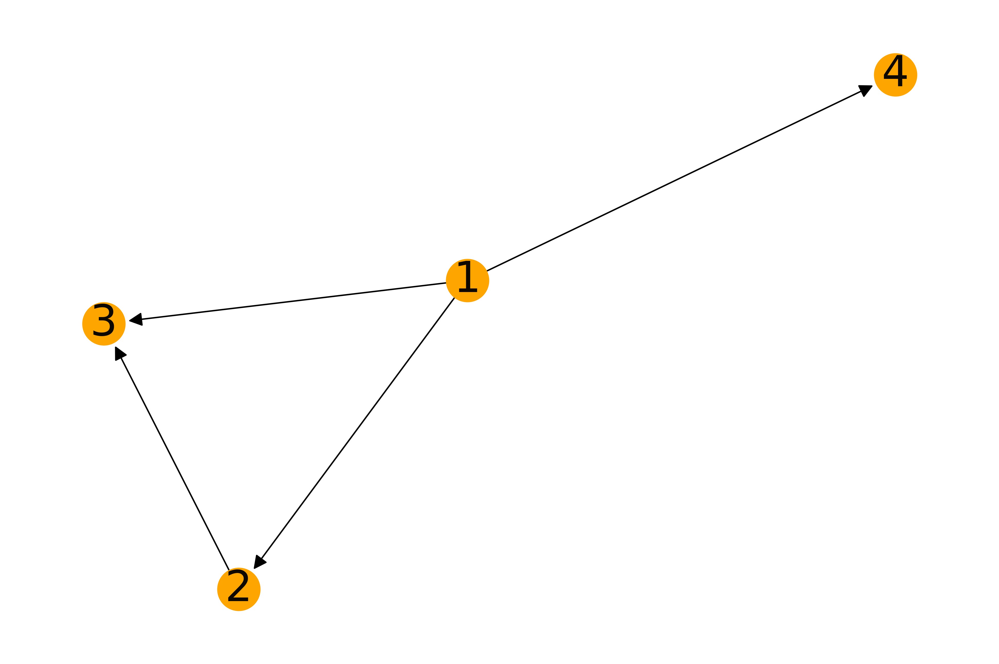

In [59]:
plot_graph(Gd)

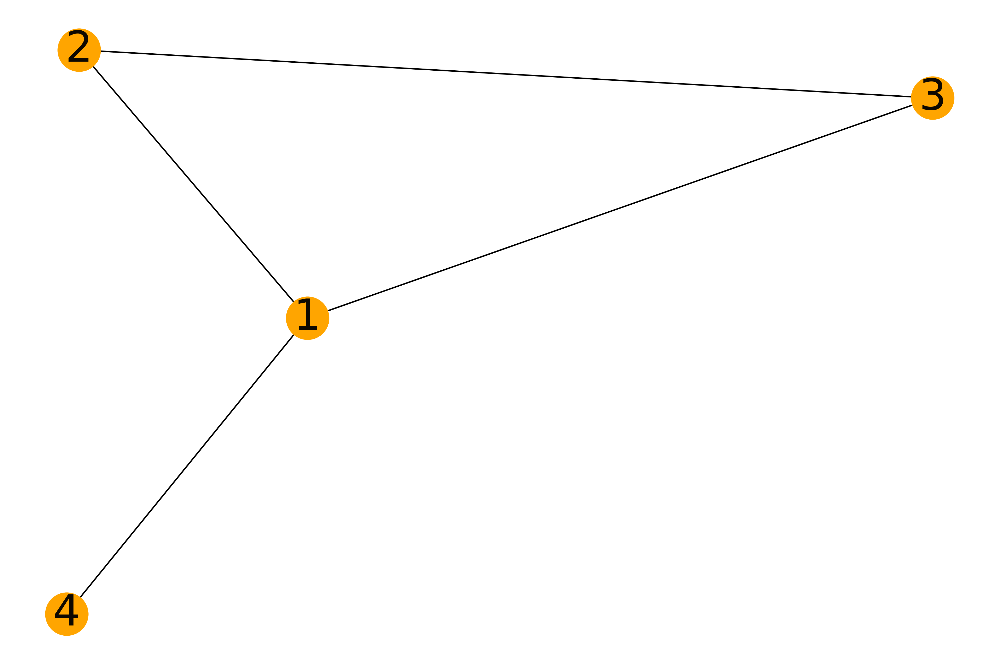

In [60]:
plot_graph(Gund)

## 3. **Degree notions!!!**

**Degree** notions!

1. For an **undirected** graph $G=(V,E)$, the **degree** $d(u)$ of a node $u \in V$ is defined as $d(u)=|V_u|$ (number of neighbors!!!).
2. For a **directed** graph $DG=(V,E)$, 
  - the **out-degree** of $u$ is the number of outgoing edges, that is, $d_{out}(u)=|\{v \in V_u: (u,v) \in V\}|$
  - the **in-degree** of $u$ is the number of ingoing edges, that is, $d_{in}(u)=|\{v \in V_u: (v,u) \in V\}|$

In [61]:
Gd.in_degree()

InDegreeView({1: 0, 2: 1, 3: 2, 4: 1})

In [134]:
Gd.out_degree()

OutDegreeView({1: 3, 2: 1, 3: 0, 4: 0})

In [63]:
Gund.degree()

DegreeView({1: 3, 2: 2, 3: 2, 4: 1})

**Question 8:** ¿$d(u)=d_{out}(u)+d_{in}(u)$?

The **degree distribution** is a usefull way to explore graph properties.

Text(0, 0.5, 'Frequency')

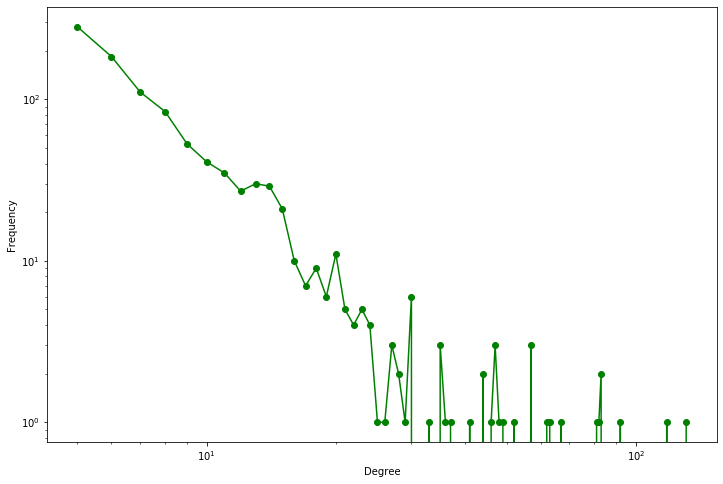

In [66]:
## degree distribution
m=5
G = nx.barabasi_albert_graph(1000, m)

## list of the frequency of each degree value
degree_freq = nx.degree_histogram(G)
degrees = range(len(degree_freq))
plt.figure(figsize=(12, 8)) 
plt.loglog(degrees[m:], degree_freq[m:],'go-') 
plt.xlabel('Degree')
plt.ylabel('Frequency')

## 4. **Adjacency matrix!!!!**

The **adjacency matrix** $A$ of a graph $G$ is defined as follows:

\begin{equation*}
A_{ij}=\begin{cases}
               1, \text{if} \ (i,j) \in E\\
               0, \text{otherwise}
            \end{cases}
\end{equation*}

The **adjacency matrix of an undirected network** has two entries for each link, e.g. link $(1,2)$ is represented as $A_{12} = 1$ and $A_{21} = 1$. Hence, the **adjacency matrix of an undirected network is symmetric**, $A_{ij} = A_{ji}$. 

For the **adjacency matrix of a directed network** of $N$ nodes its elements being:

- $A_{ij} = 1$ if there is a link pointing from node i to node j ([NetworkX convention](https://networkx.github.io/documentation/networkx-1.11/reference/generated/networkx.linalg.graphmatrix.adjacency_matrix.html))
 
- $A_{ij} = 0$ if nodes i and j are not connected to each other 

A natural application of the **adjacency matrix** is to easily calculate **degree.** 

- For **undirected networks** a node’s degree is a sum over either the rows or the columns of the matrix:

$$
k_i=\sum_{i=1}^N A_{ij}=\sum_{j=1}^N A_{ij}
$$
- For **directed networks** the sums over the adjacency matrix’ rows and columns provide the incoming and outgoing degrees, respectively

$$
k_i^{in}=\sum_{j=1}^N A_{ij}
$$

$$
k_i^{out}=\sum_{j=1}^N A_{ji}
$$

In [67]:
## examples

G=nx.Graph()
G.add_edges_from([(1,2),(1,3),(1,4),(2,3)])

DG=nx.DiGraph()
DG.add_edges_from([(1,2),(1,3),(1,4),(2,3)])

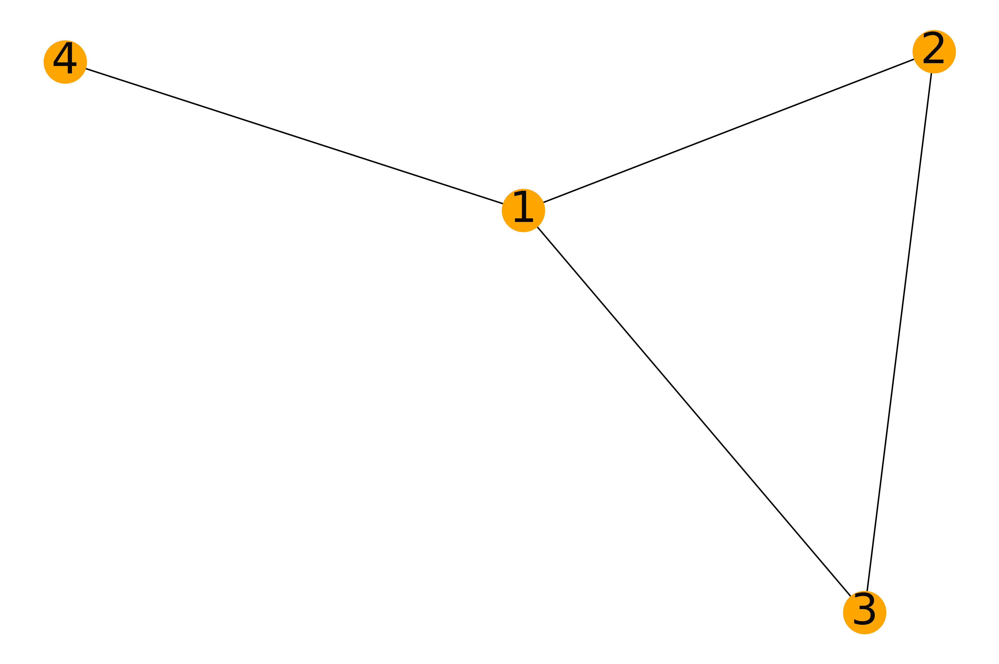

In [68]:
plot_graph(G)

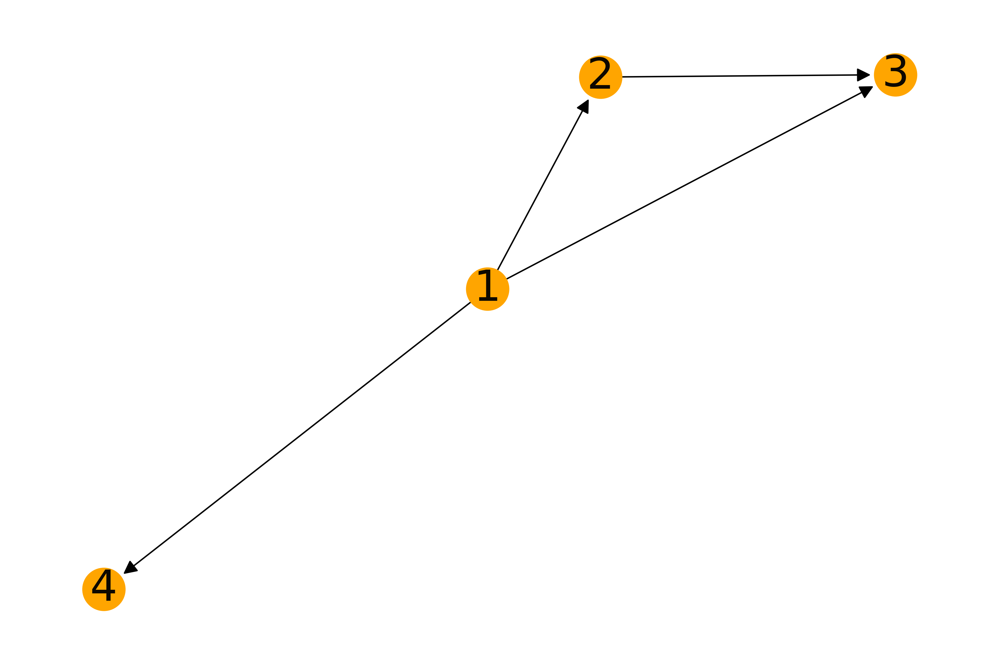

In [69]:
plot_graph(DG)

In [70]:
Mg=nx.adjacency_matrix(G).todense()

Mdg=nx.adjacency_matrix(DG).todense()

In [71]:
print(Mg)

[[0 1 1 1]
 [1 0 1 0]
 [1 1 0 0]
 [1 0 0 0]]


In [142]:
Mg[1,:]

matrix([[1, 0, 1, 0]], dtype=int64)

In [143]:
int(Mg[1,:].sum(axis=1))

2

In [144]:
print(Mdg)

[[0 1 1 1]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]]


In [145]:
Mdg[1,:]

matrix([[0, 0, 1, 0]], dtype=int64)

In [146]:
int(Mdg[1,:].sum(axis=1))

1

## 5. **Paths and connectedness!!!**

**Paths!** Consider a graph $G=(V,E)$. 
1. A **walk** is an alternating sequence of nodes and edges of the form $u_0,e_1,u_1,...,u_k$ such that for $1 \leqslant i \leqslant k$, the edge $i$ has endpoints $u_{i-1}$ and $u_i$. A **path** is a **walk** without repeated nodes. The **length** of a **walk** is its number of edges. A **$u,v$-walk** is a walk with endpoints $u$ and $v$. A **walk** is said to be **closed** if its endpoints are the same. A **cycle** is a closed walk.

2. A **shortest path** from node $u$ to node $v$, with $u,v \in V$, is a **$u,v$-walk** of minimal length. 



In [72]:
## an example!!!
D={'vehículo':'medio de transporte de personas o cosas.','automóvil':'vehículo que puede ser guiado para marchar por una vía ordinaria sin necesidad de carriles y lleva un motor','coche':'automóvil destinado al transporte de personas y con capacidad no superior a siete plazas'}

In [73]:
D

{'vehículo': 'medio de transporte de personas o cosas.',
 'automóvil': 'vehículo que puede ser guiado para marchar por una vía ordinaria sin necesidad de carriles y lleva un motor',
 'coche': 'automóvil destinado al transporte de personas y con capacidad no superior a siete plazas'}

In [74]:
table = str.maketrans({key: None for key in '!"#$%&\¿()*+,-./:;<=>?@[\\]_{|}'})
D={key:D[key].translate(table).split(' ') for key in D.keys()}

In [75]:
D

{'vehículo': ['medio', 'de', 'transporte', 'de', 'personas', 'o', 'cosas'],
 'automóvil': ['vehículo',
  'que',
  'puede',
  'ser',
  'guiado',
  'para',
  'marchar',
  'por',
  'una',
  'vía',
  'ordinaria',
  'sin',
  'necesidad',
  'de',
  'carriles',
  'y',
  'lleva',
  'un',
  'motor'],
 'coche': ['automóvil',
  'destinado',
  'al',
  'transporte',
  'de',
  'personas',
  'y',
  'con',
  'capacidad',
  'no',
  'superior',
  'a',
  'siete',
  'plazas']}

In [76]:
def create_graph(dictionary):
    G=nx.Graph()
    for key in dictionary.keys():
        pairs=[(key,word) for word in dictionary[key]]
        for pair in pairs:
            if G.has_edge(pair[0],pair[1])==False:
                G.add_edge(pair[0],pair[1])
        
    return G

In [77]:
graph_D=create_graph(D)

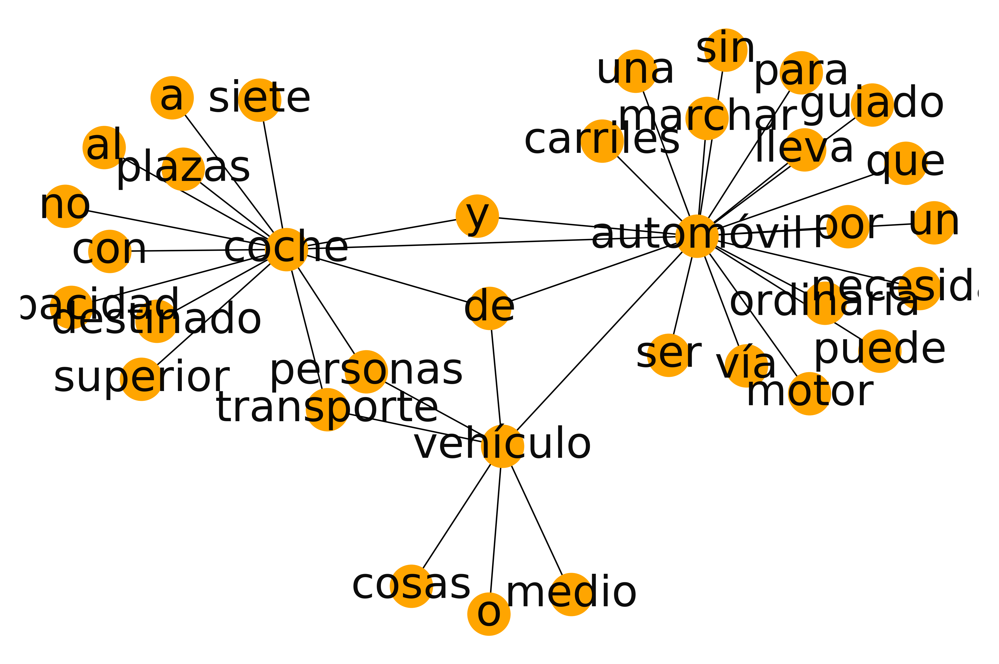

In [78]:
plot_graph(graph_D)

In [79]:
paths = list(nx.shortest_simple_paths(graph_D, 'vehículo', 'coche'))

In [80]:
paths

[['vehículo', 'automóvil', 'coche'],
 ['vehículo', 'transporte', 'coche'],
 ['vehículo', 'de', 'coche'],
 ['vehículo', 'personas', 'coche'],
 ['vehículo', 'automóvil', 'de', 'coche'],
 ['vehículo', 'de', 'automóvil', 'coche'],
 ['vehículo', 'automóvil', 'y', 'coche'],
 ['vehículo', 'de', 'automóvil', 'y', 'coche']]

**Connectedness!** 

1. Two nodes $u$ and $v$ of a graph $G=(V,E)$ are said to be **connected** if there is a path between them.

2. $G$ is said to be **connected** if any pair of nodes is connected.

3. A **connected component** of an undirected graph $G=(V,E)$ is a maximal induced subgraph $G'=(V',E')$, in which any pair of nodes $u,v \in V'$ is connected.

1


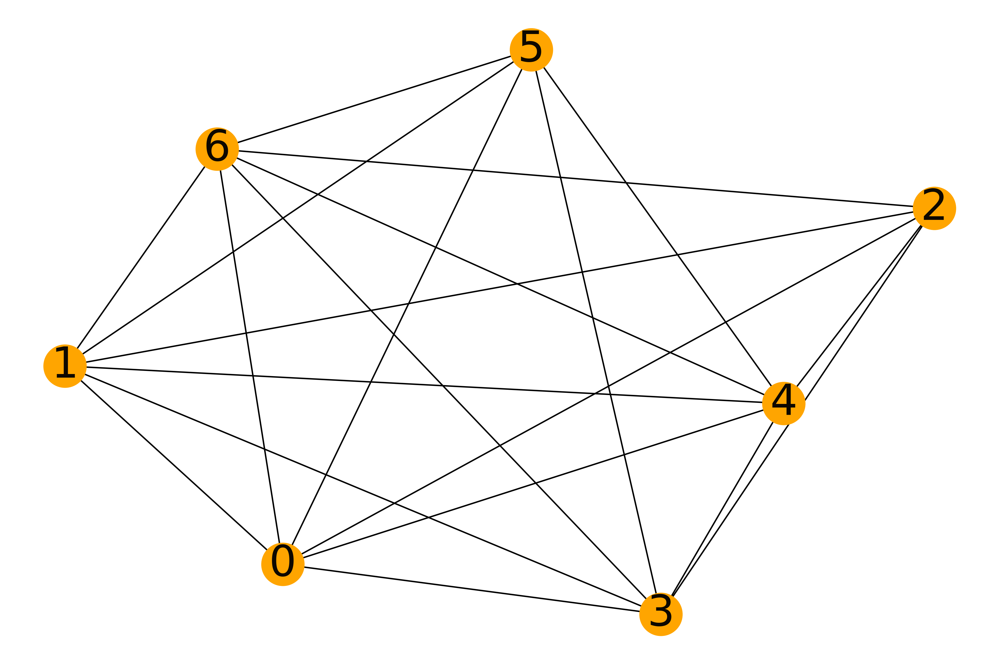

1


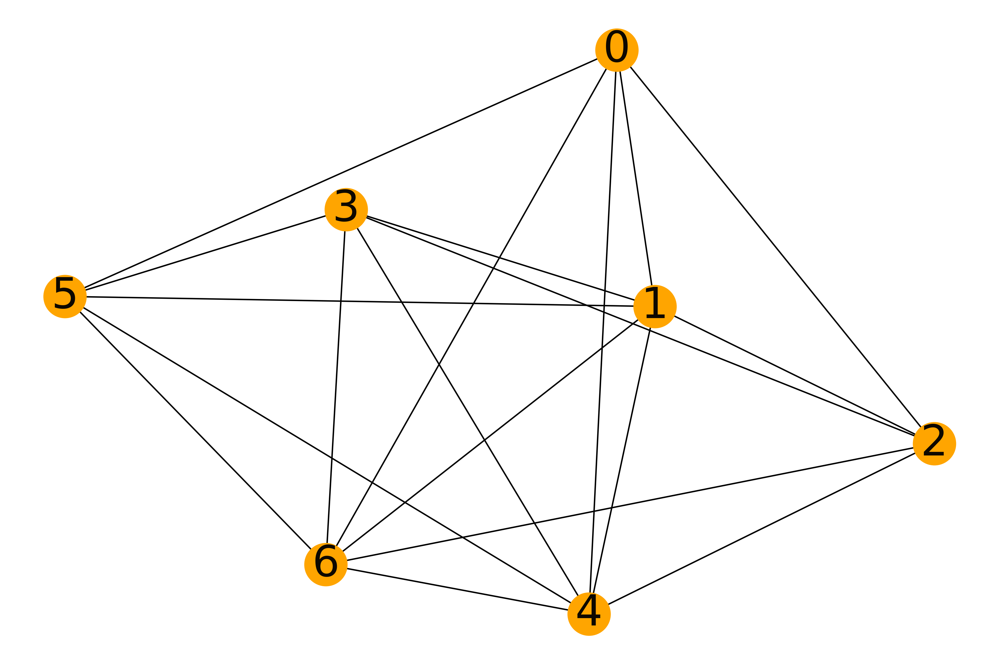

1


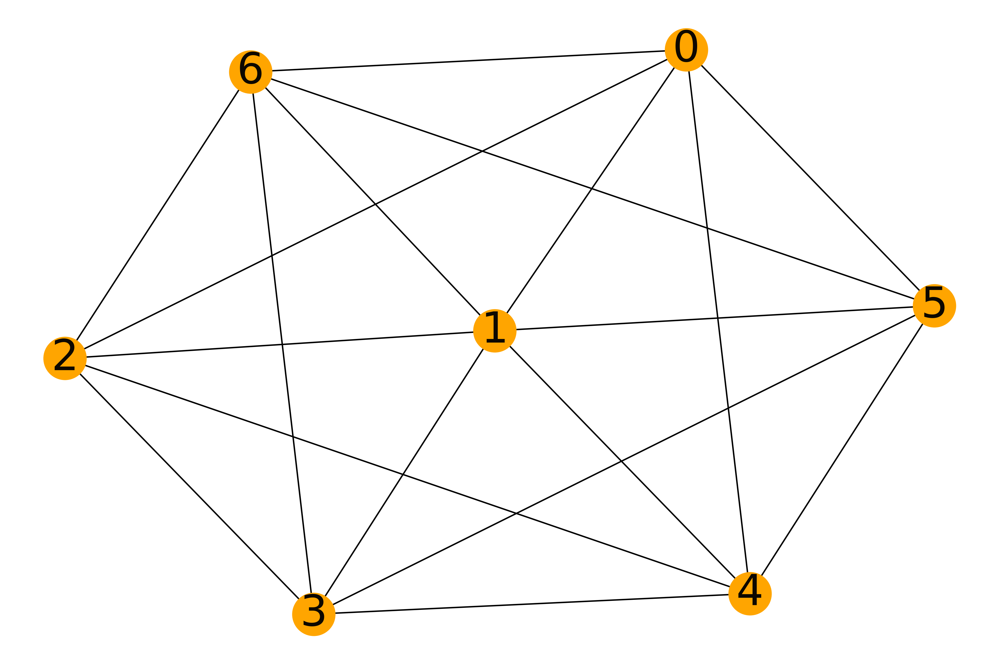

1


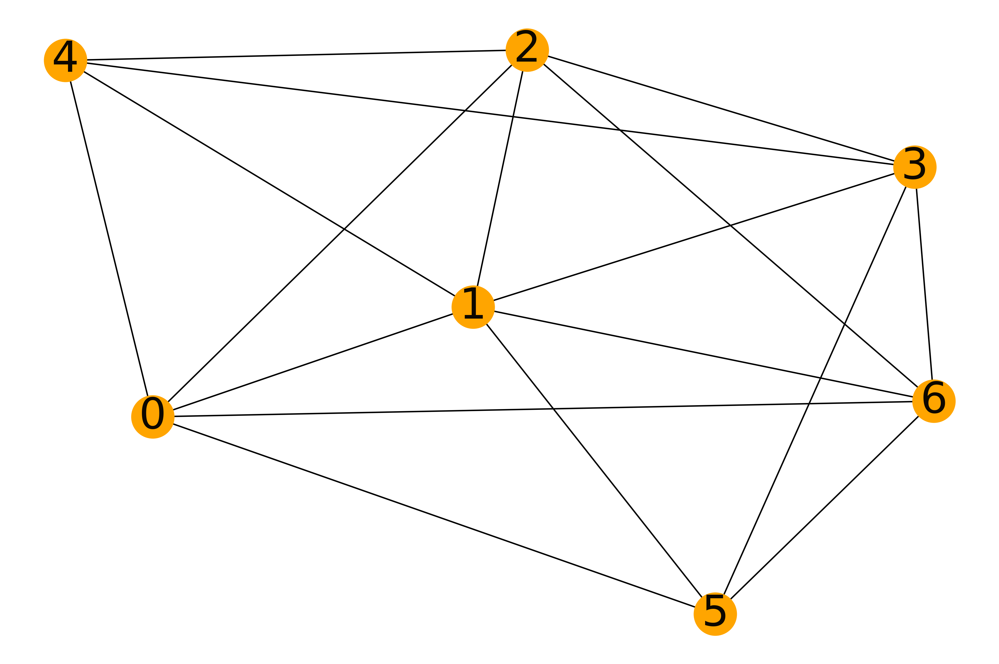

1


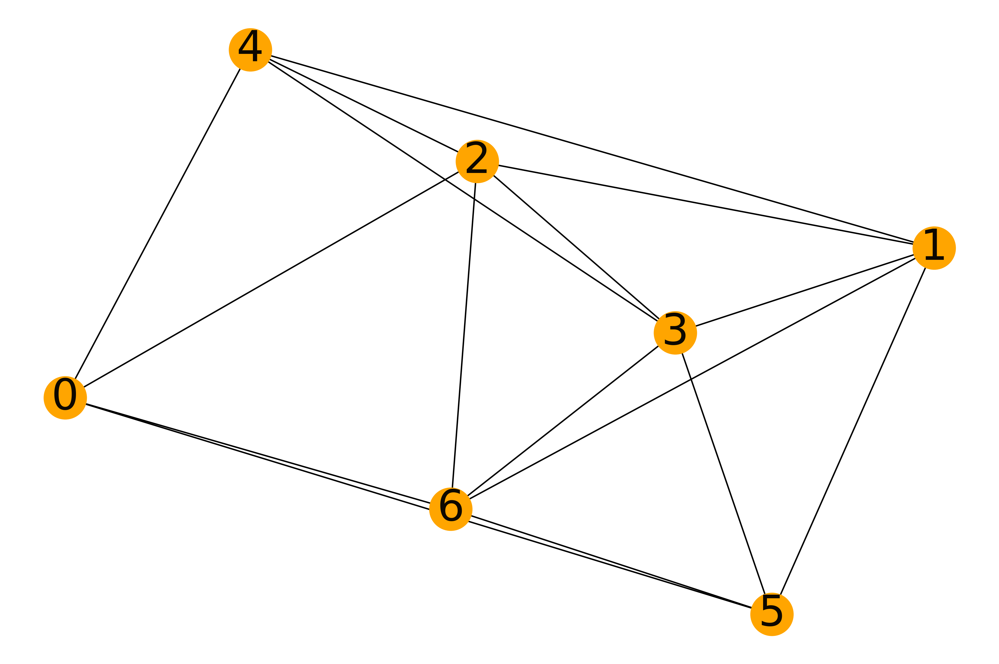

1


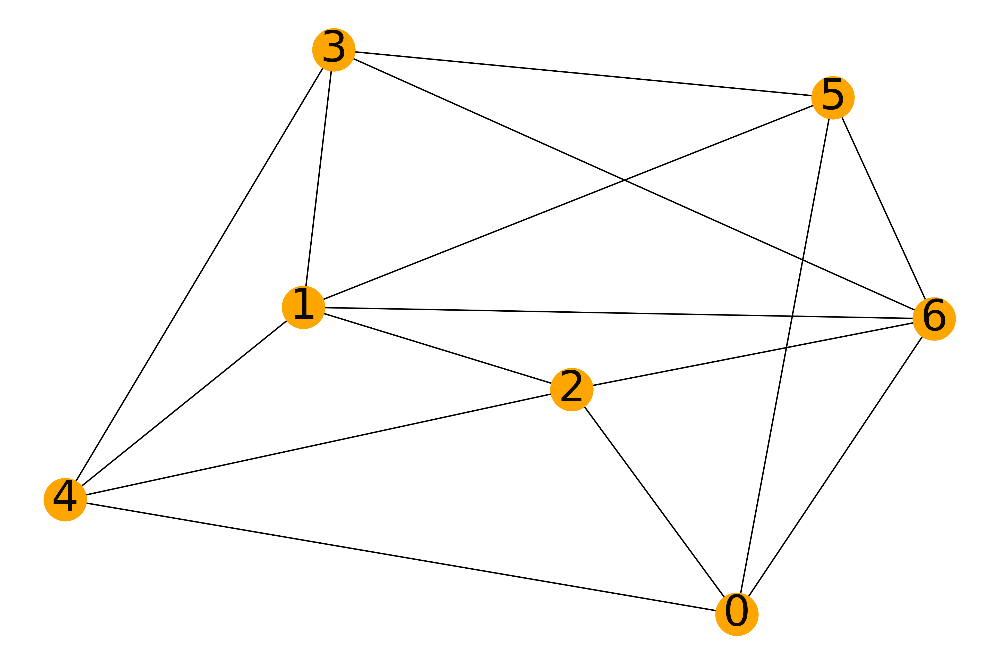

1


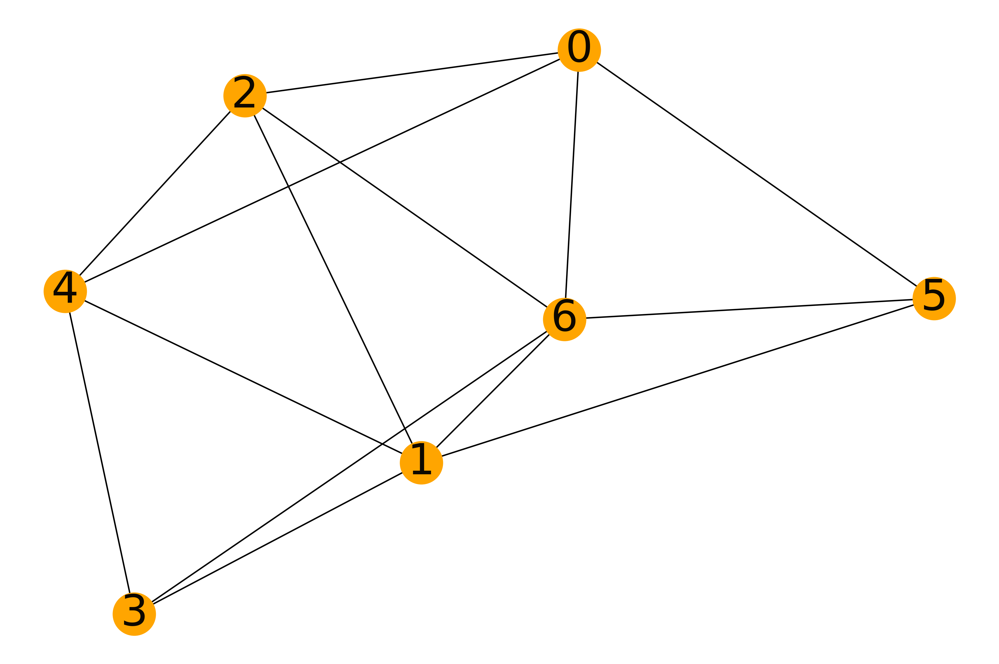

1


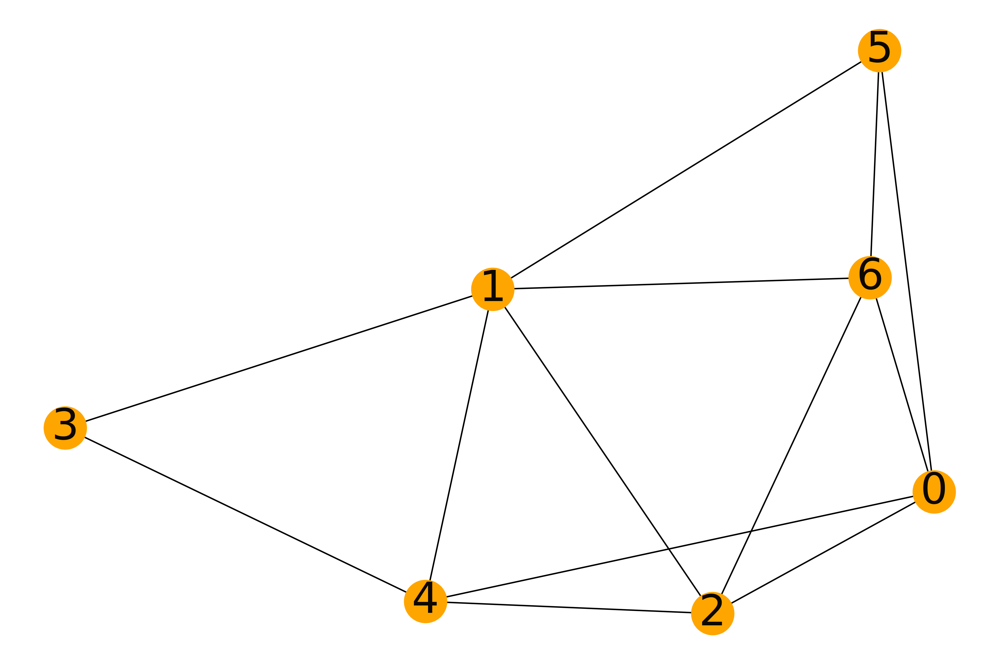

1


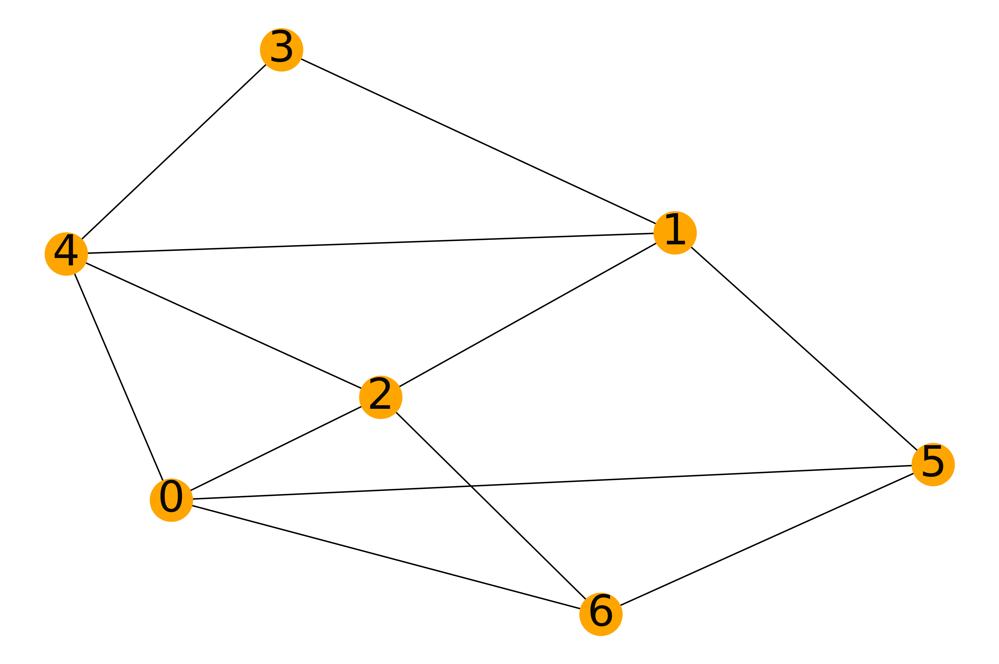

1


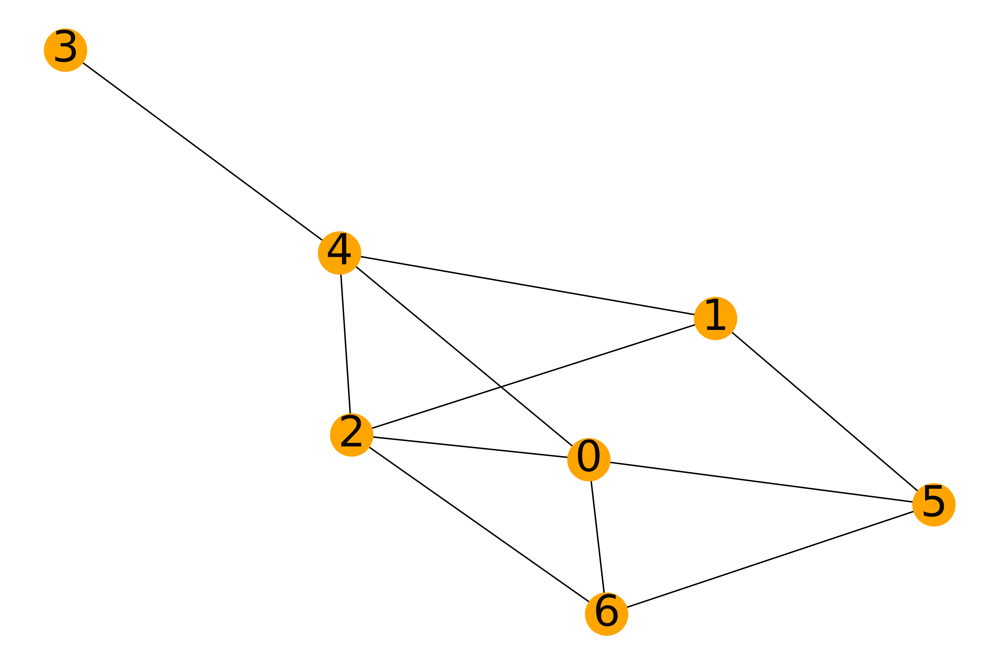

1


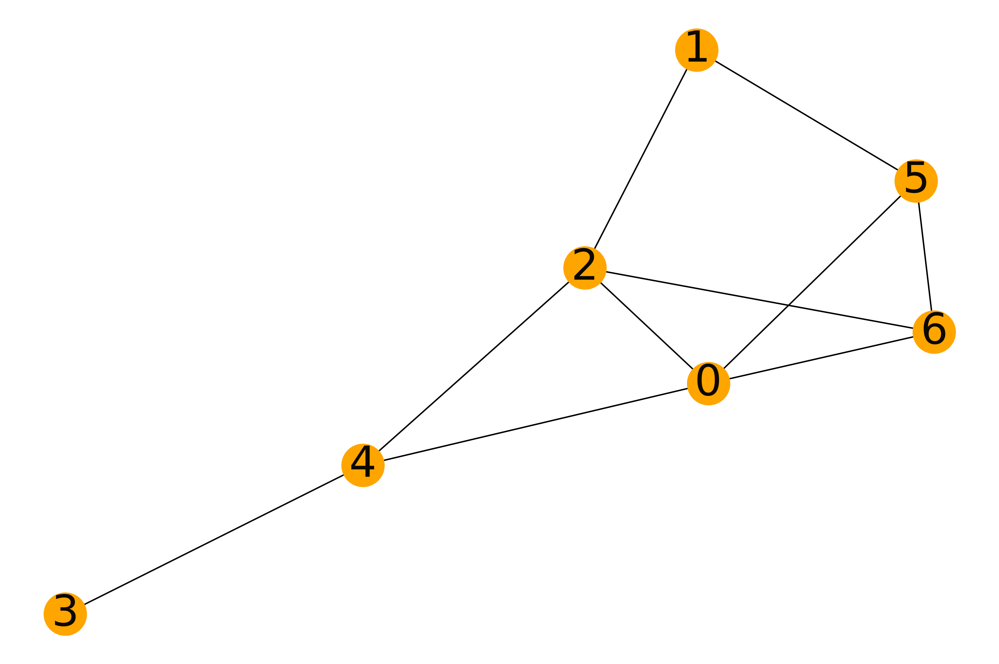

1


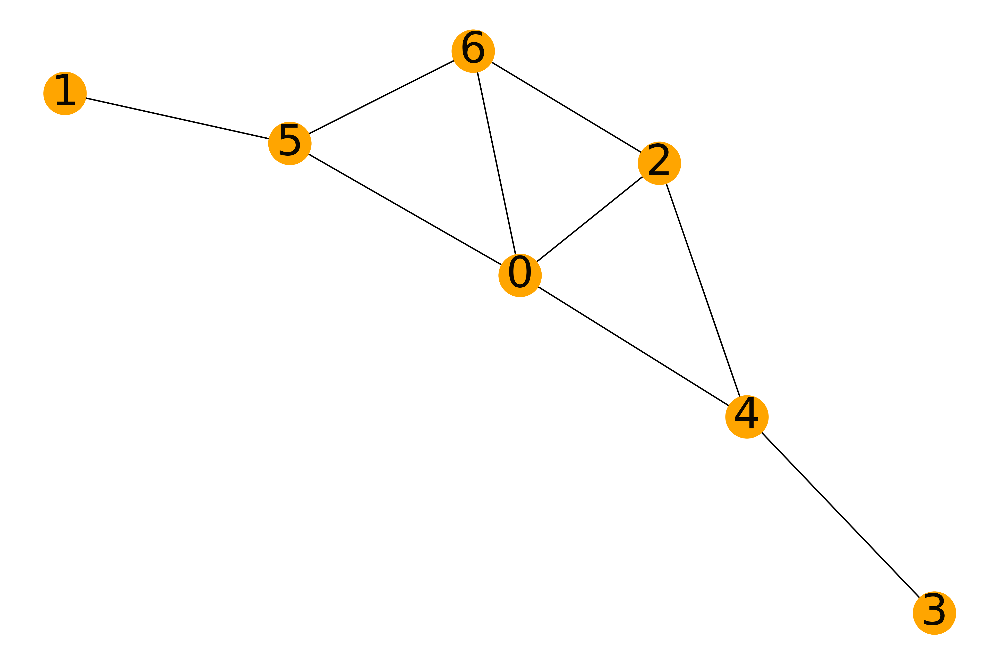

2


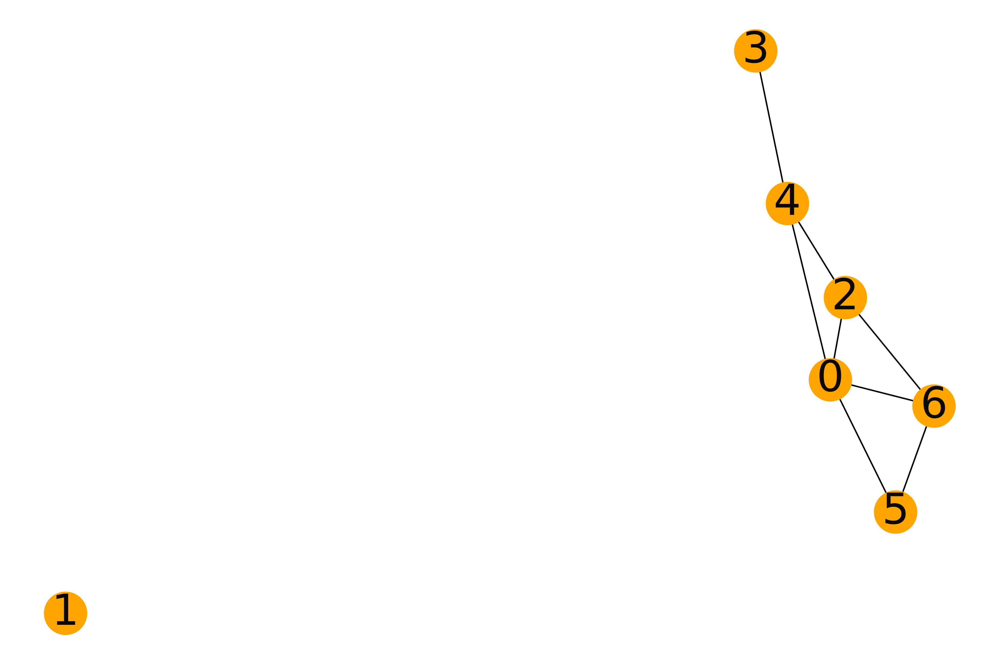

2


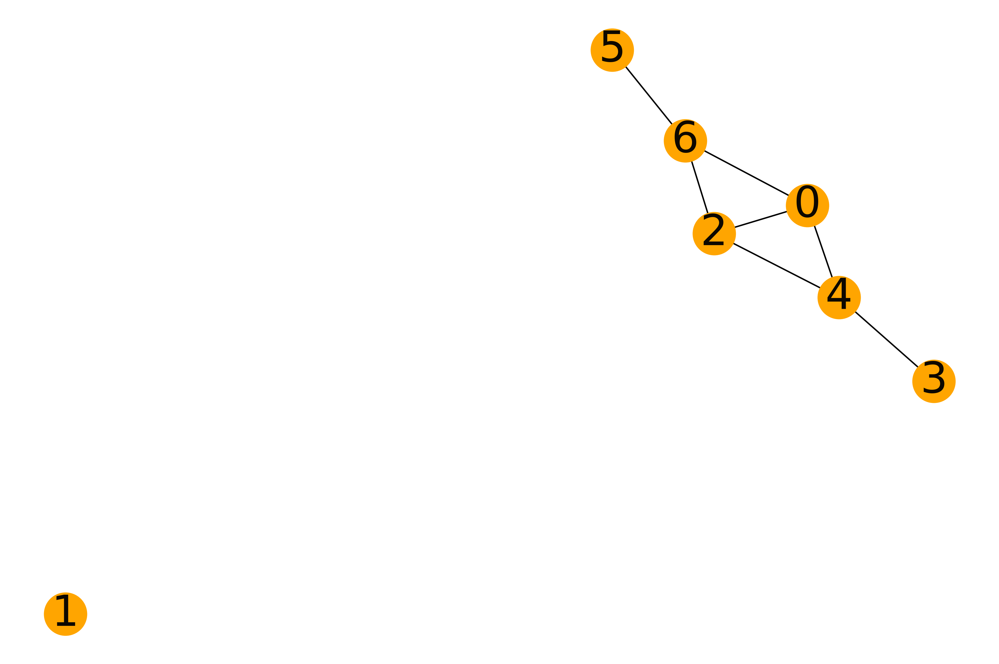

2


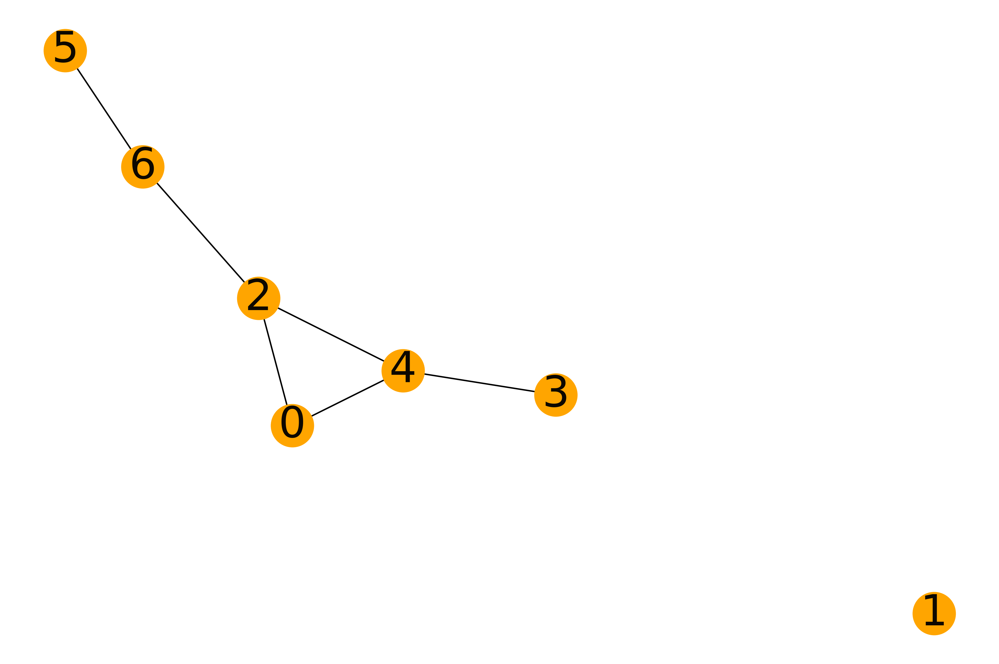

2


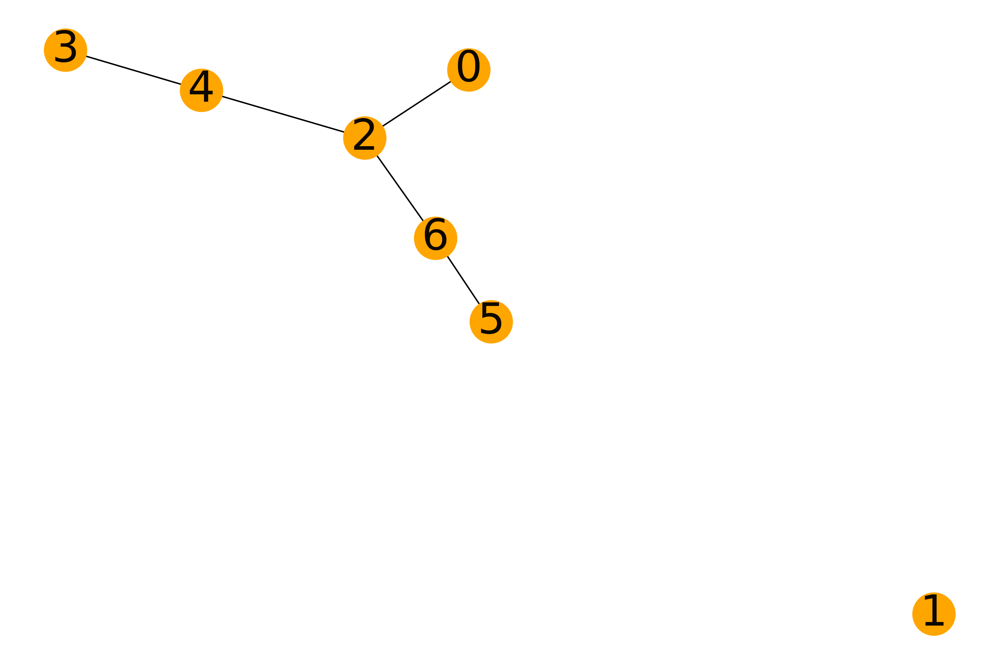

3


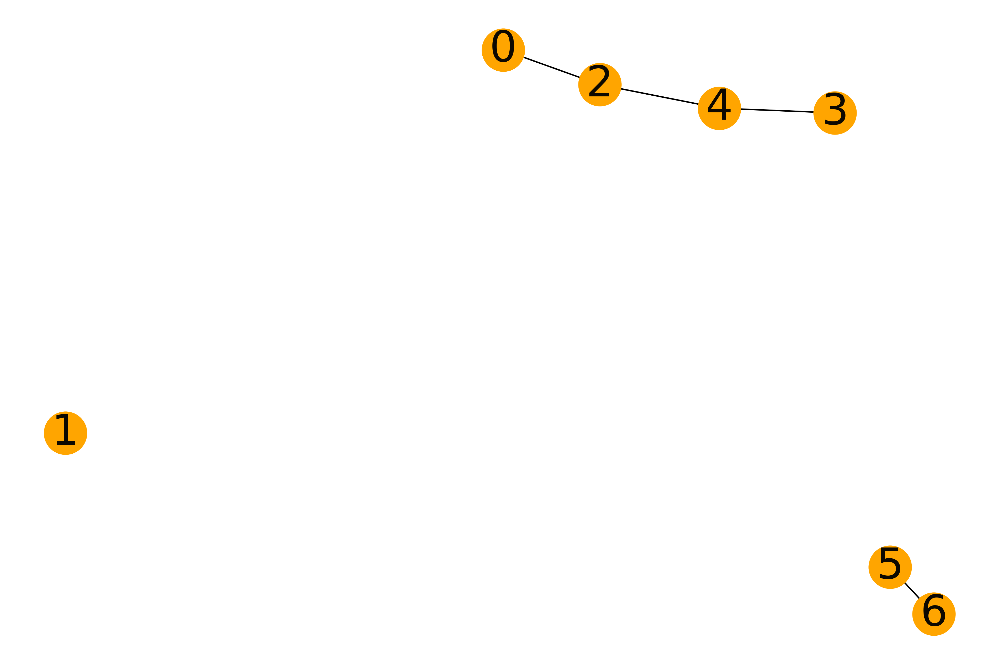

4


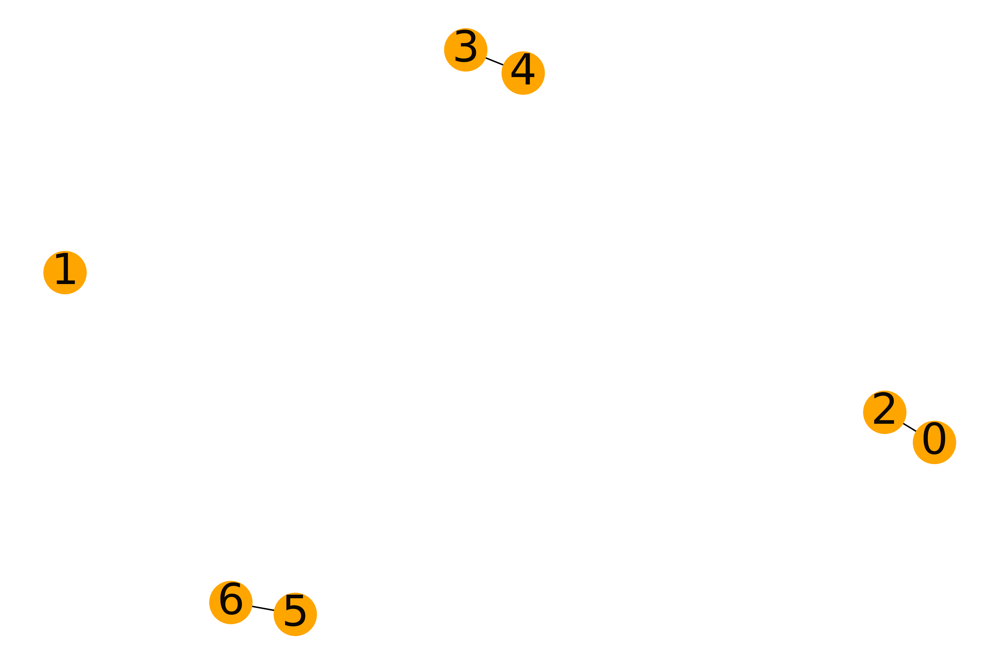

5


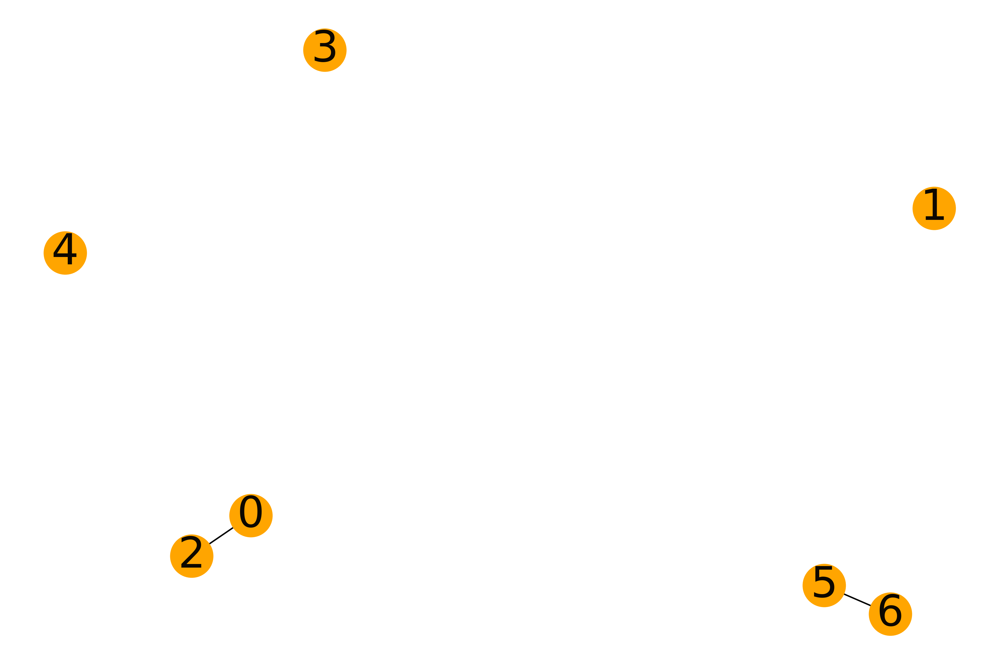

6


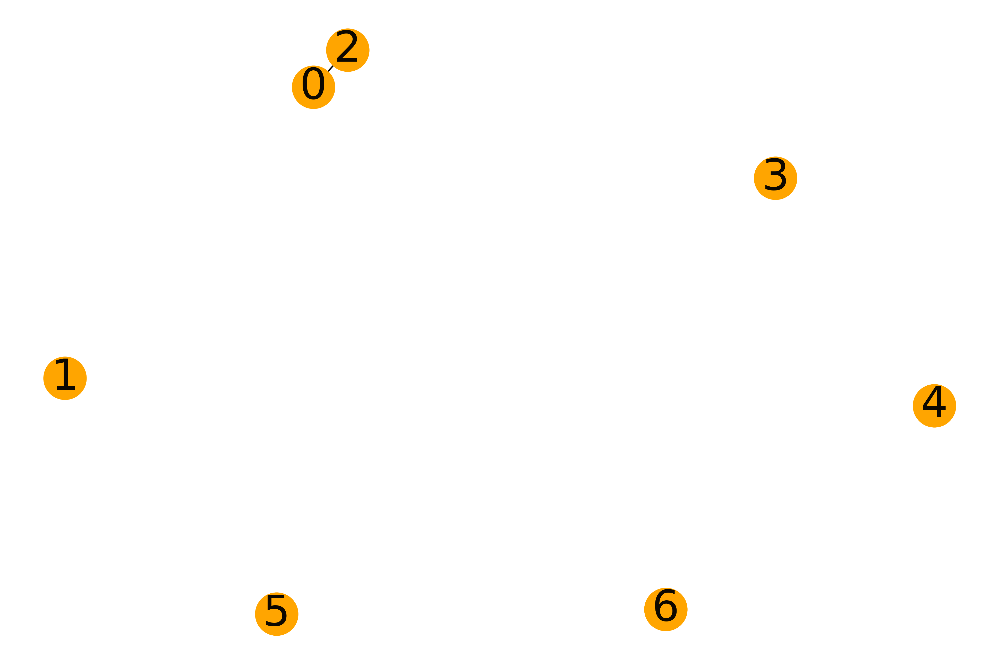

7


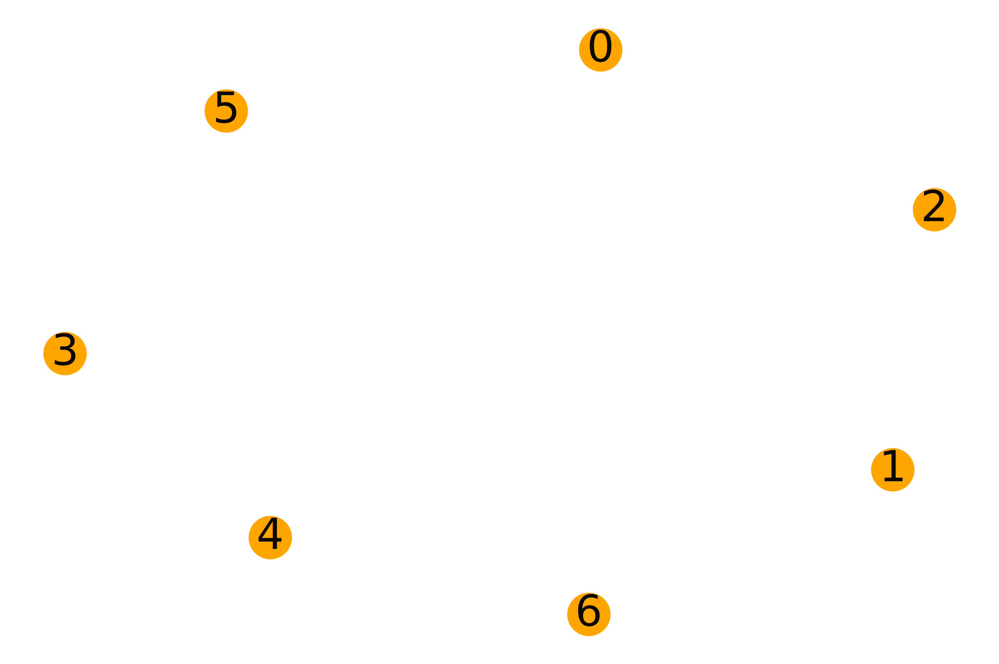

In [81]:
## connected components!
k=7
percentage=0.2
Kn=nx.complete_graph(k) ## karate!
while len(Kn)>0:
    try:
        ## borrar por grado!!! evolución del número de componantes conexas!!!
        edges=random.sample(Kn.edges(),int(len(Kn)*percentage))
        Kn.remove_edges_from(edges)
        print(nx.number_connected_components(Kn))
        #plot_graph(Kn.subgraph(max(nx.connected_components(Kn), key=len)))
        plot_graph(Kn)
    except ValueError:
        break
  

## 6. **Trees!!!**

**Trees! :)** Two equivalent definitions:

1. A connected acyclic graph.

2. An undirected graph in which any pair of nodes is joined only by one path.

What is the **intuition** behind 1 and 2?

**The main idea is:** in a tree there cannot exist two different paths that join two nodes, otherwise a cycle would form. 

**Question 11:** Prove that:

Let $G = (V,E)$ be a tree. Prove that if we remove any edge $e\in E$, the resulting graph $G-e$ will not be connected.

**Question 12:** Prove that:

a tree with $n$ nodes has $n-1$ links.

**The main idea is:** Let $T$ be a tree with $n$ vertices and let $e$ be the edge $e=(u,v)$. We know that the deletion of $e$ disconnects $T$. $T-e$ consists exactly of two tree components $T_1$ and $T_2$. These trees have respectively $n_1$ and $n_2$ nodes, with $n_1+n_2=n$. By induction hypothesis, the number of edges (for $T_1$ and $T_2$) is $n_1-1$ and $n_2-1$. Therefore, the number of edges in $T$ is $n_1-1+n_2-1+1=n-1$. 

A **forest** is an undirected graph, all of whose connected components are **trees**. 

In [86]:
## tree!!
n=15
T=nx.random_tree(n)

In [87]:
T.number_of_edges()

14

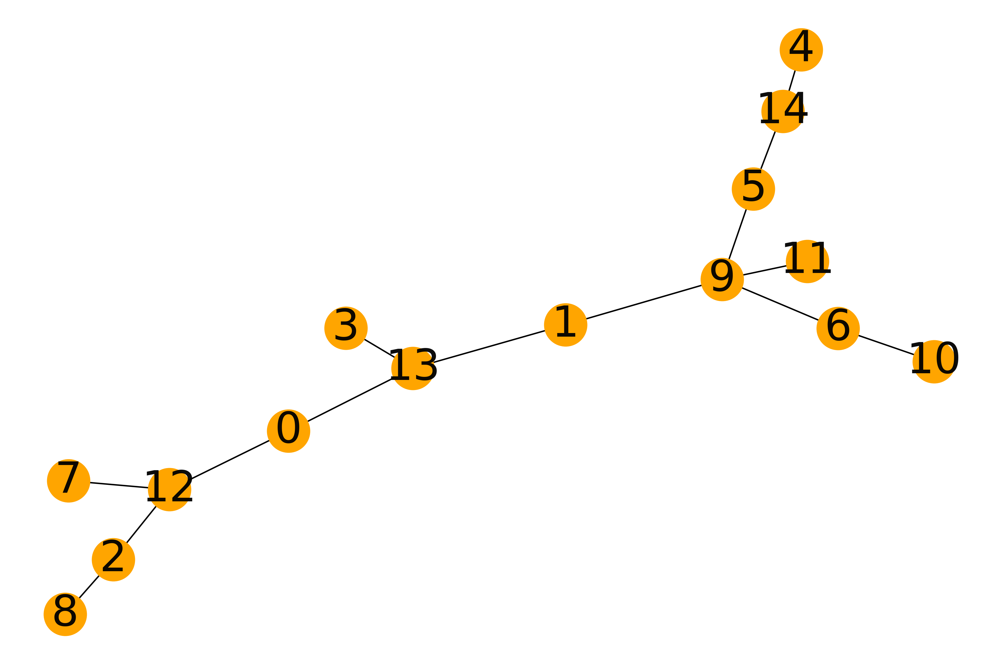

In [89]:
plot_graph(T)

In [90]:
S=nx.star_graph(n)

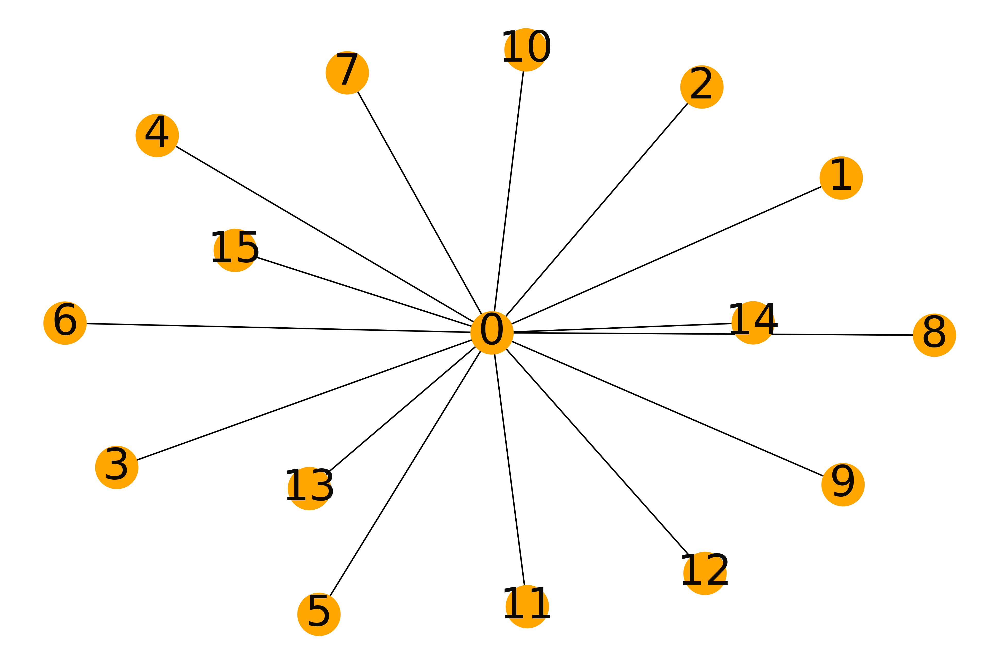

In [91]:
plot_graph(S)

In [92]:
P=nx.path_graph(n)

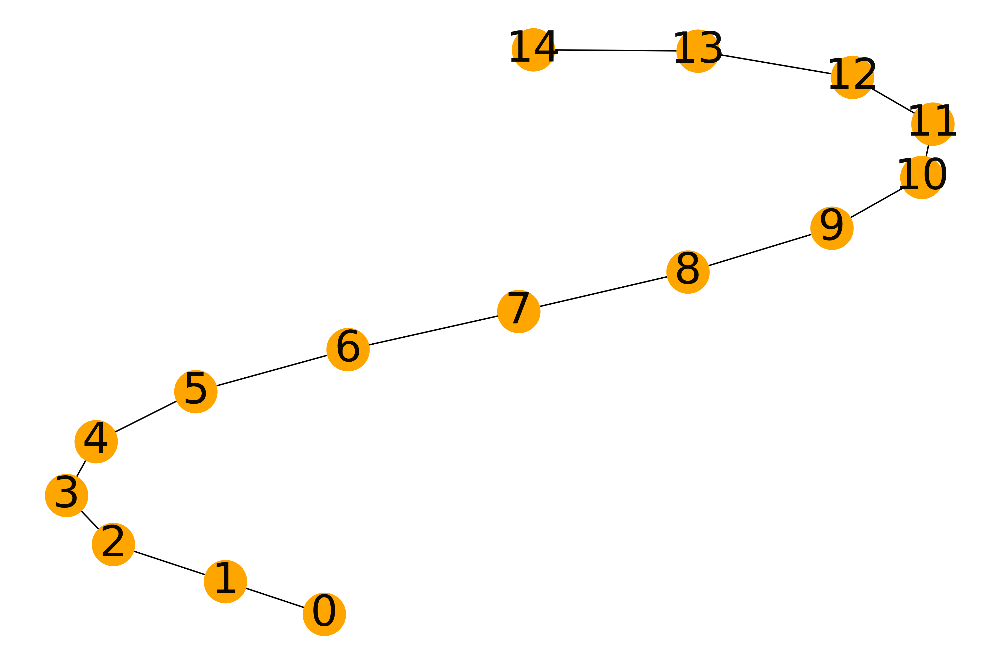

In [93]:
plot_graph(P)

## 7. **Bipartite graphs!!!**

A **bipartite** graph is a triple $G=(T,B,E)$ where $T$ and $B$ are two disjoint sets of edges of nodes (respectively, top and bottom nodes), and $E \subseteq T \times B$ is the set of edges. 

Equivalently, a graph is **bipartite** if and only if it does not contain **odd-lenght cycles**. 

**Examples:** actors, coauthoring, cooccurrence!

[link text](https://graal.ens-lyon.fr/~abenoit/reso06/papier/biparti.pdf)

**Question 13:** Denote $deg(u)$ the degree of a node. What is the relationship between $\sum_{t \in T} deg(t)$ and $\sum_{b \in B} deg(b)$?

In [174]:
## example!

from networkx.algorithms import bipartite
B = nx.Graph()

B.add_nodes_from([1, 2, 3, 4], bipartite=0)
B.add_nodes_from(["a", "b", "c"], bipartite=1)

B.add_edges_from([(1, "a"), (1, "b"), (2, "b"), (2, "c"), (3, "c"), (4, "a")])

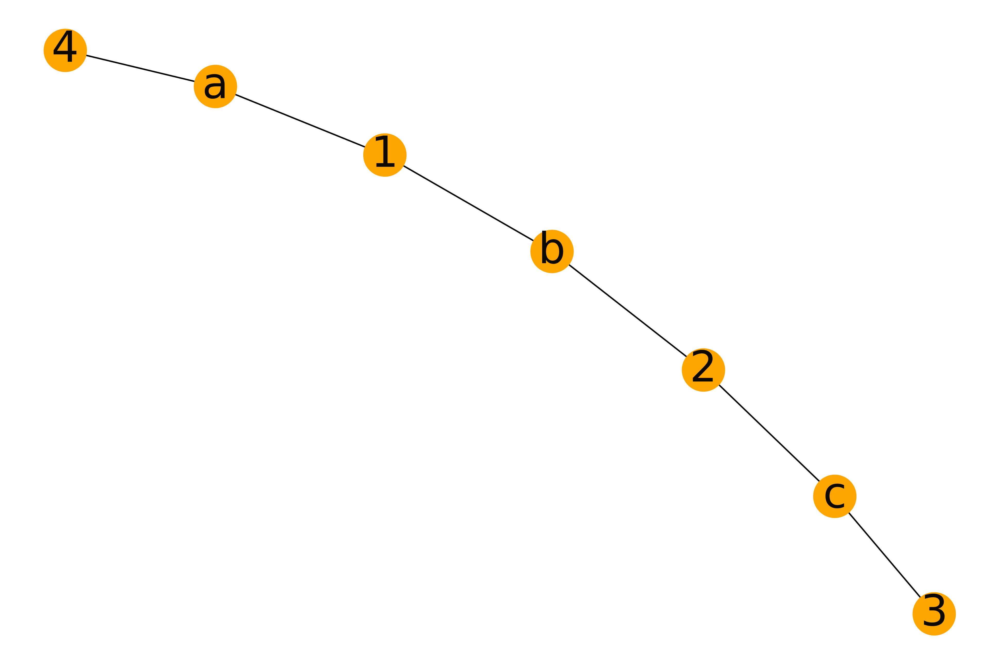

In [175]:
plot_graph(B)

In [179]:
sum(dict(B.degree([1, 2, 3, 4])).values())

6

In [180]:
sum(dict(B.degree(['a','b','c'])).values())

6

In [181]:
## another example!!!

import nltk
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /home/ec2-user/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/ec2-user/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [182]:
from nltk import sent_tokenize
from nltk.corpus import stopwords
stop_words=set(stopwords.words('english'))

In [183]:
text="Allyson Michelle Felix OLY (born November 18, 1985) is an American track and field sprinter who competes in the 100 meters, 200 meters, and 400 meters. At 200 meters, she is the 2012 Olympic champion, a 3-time World champion (2005–09), and 2-time Olympic silver medalist (2004–08). At 400 meters, she is the 2015 World champion, 2011 World silver medalist, 2016 Olympic silver medalist, and 2017 World bronze medalist. Felix has won five additional Olympic gold medals as a member of the United States' women's relay teams: three at 4 × 400 meters (2008–16), and two at 4 x 100 meters (2012–16). The 2012 U.S. Olympic 4 x 100 meters team also set the women's 4x100 meters world-record that still stands. Felix is the only female track and field athlete to ever win six Olympic gold medals, and is tied with Merlene Ottey as the most decorated female Olympian in track and field history, with a total of nine Olympic medals. Felix is also the most decorated athlete in IAAF World Championships history with 16 career medals.Felix's 200 meters best of 21.69 secs from 2012, ranks her sixth on the all-time list. In 2013, she broke the world best for the rarely contested 150 meters distance, running 16.36 secs. In the 4 × 400 metres relay at the 2015 World Championships, she ran the fastest split ever recorded by an American woman, and third fastest split ever after Jarmila Kratochvilova and Marita Koch, with 47.72. As a participant in the US Anti-Doping Agency's 'Project Believe' program, Felix is regularly tested for performance-enhancing drugs. She is coached by Bobby Kersee."

In [184]:
sentences=[[word for word in s.lower().translate(table).split(' ') if word not in stop_words] for s in sent_tokenize(text)]

In [185]:
sentences

[['allyson',
  'michelle',
  'felix',
  'oly',
  'born',
  'november',
  '18',
  '1985',
  'american',
  'track',
  'field',
  'sprinter',
  'competes',
  '100',
  'meters',
  '200',
  'meters',
  '400',
  'meters'],
 ['200',
  'meters',
  '2012',
  'olympic',
  'champion',
  '3time',
  'world',
  'champion',
  '2005–09',
  '2time',
  'olympic',
  'silver',
  'medalist',
  '2004–08'],
 ['400',
  'meters',
  '2015',
  'world',
  'champion',
  '2011',
  'world',
  'silver',
  'medalist',
  '2016',
  'olympic',
  'silver',
  'medalist',
  '2017',
  'world',
  'bronze',
  'medalist'],
 ['felix',
  'five',
  'additional',
  'olympic',
  'gold',
  'medals',
  'member',
  'united',
  "states'",
  "women's",
  'relay',
  'teams',
  'three',
  '4',
  '×',
  '400',
  'meters',
  '2008–16',
  'two',
  '4',
  'x',
  '100',
  'meters',
  '2012–16'],
 ['2012',
  'us',
  'olympic',
  '4',
  'x',
  '100',
  'meters',
  'team',
  'also',
  'set',
  "women's",
  '4x100',
  'meters',
  'worldrecord',
  '

In [186]:
from networkx.algorithms import bipartite

def bipartite_graph(sent):
    words=[item for sublist in sent for item in sublist]
    unique_words=list(set(words))
    B = nx.Graph() ## graph!
    ## bipartite!
    B.add_nodes_from(range(len(sent)), bipartite=0) ## sentences
    B.add_nodes_from(unique_words, bipartite=1) ## words
    
    for i in range(len(sent)):
        for word in unique_words:
            sentence=sent[i]
            n=sentence.count(word)
            if n>0:
                if B.has_edge(i,word)==False:
                    B.add_edge(i,word,weight=n) 
        
    return B
  

In [187]:
B=bipartite_graph(sentences)

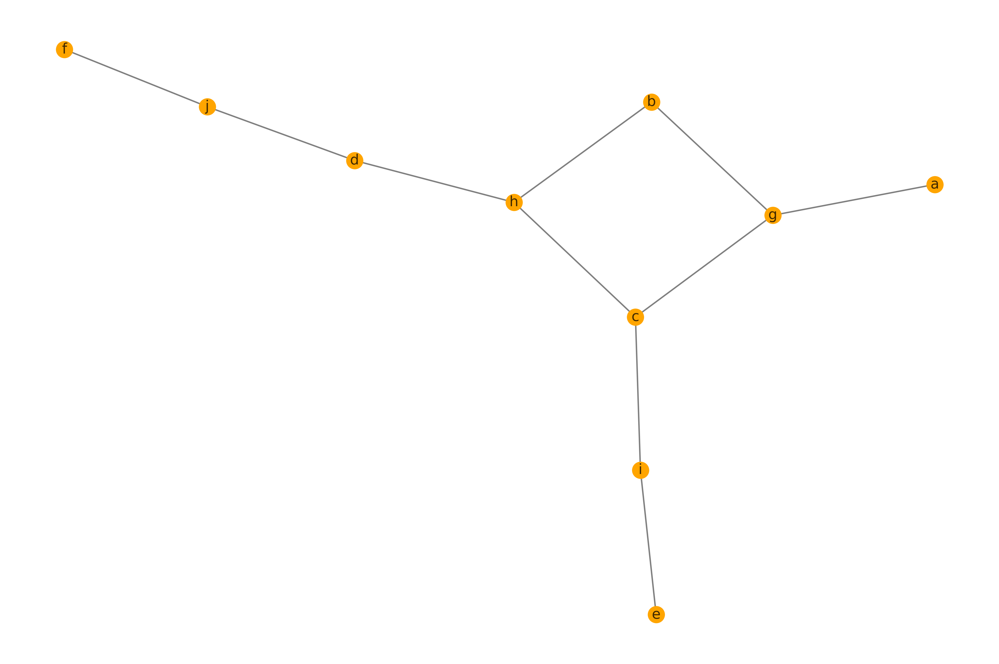

In [210]:
def plot_graph(G,font_size):
    fig, ax = plt.subplots(dpi=800)
    pos = nx.kamada_kawai_layout(G)
    labels={i:i for i in G.nodes}
    nx.draw_networkx_nodes(G, pos, node_size = 25, node_color='orange') 
    nx.draw_networkx_edges(G, pos, alpha=0.5,width=0.5,edge_color='k')
    nx.draw_networkx_labels(G,pos,labels,alpha=0.75,font_size=font_size,font_color='k')
    plt.axis('off')
    plt.show()

plot_graph(B,5)

#### **Question 14:** Study projections in bipartite graphs. 

In [211]:
## a simple example
B = nx.Graph() ## graph!
B.add_nodes_from(['a','b','c','d','e','f'], bipartite=0) 
B.add_nodes_from(['g','h','i','j'], bipartite=1)
B.add_edges_from([('a','g'),('b','g'),('b','h'),('c','g'),('c','h'),('c','i'),('d','h'),('d','j'),('e','i'),('f','j')]) 

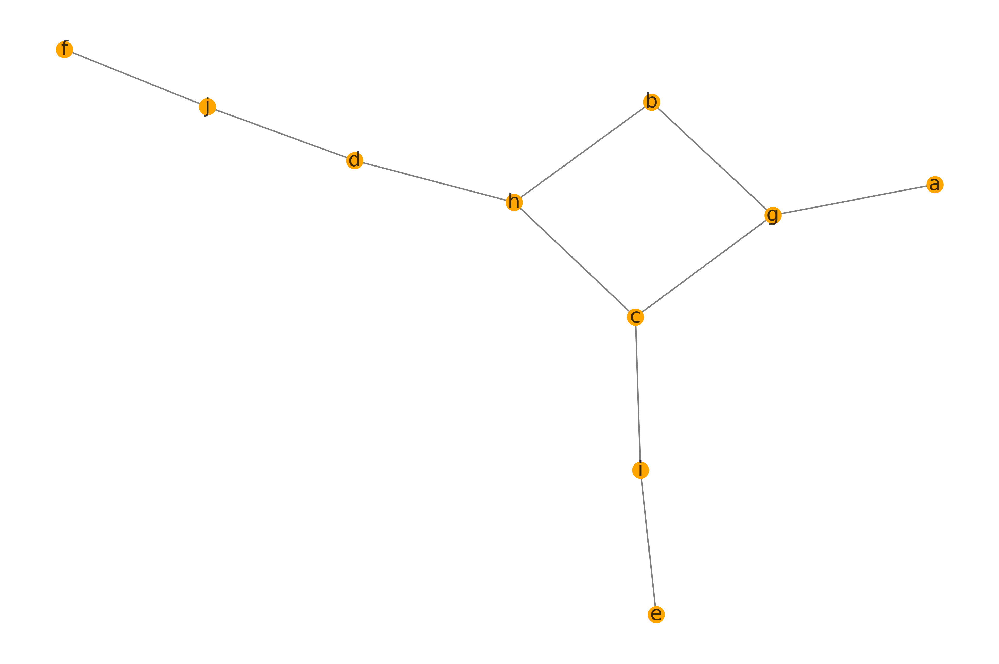

In [212]:
plot_graph(B,7)

In [213]:
bottom_nodes, top_nodes = bipartite.sets(B)

In [214]:
bottom_nodes

{'a', 'b', 'c', 'd', 'e', 'f'}

In [215]:
top_nodes

{'g', 'h', 'i', 'j'}

In [216]:
G = bipartite.projected_graph(B,top_nodes)

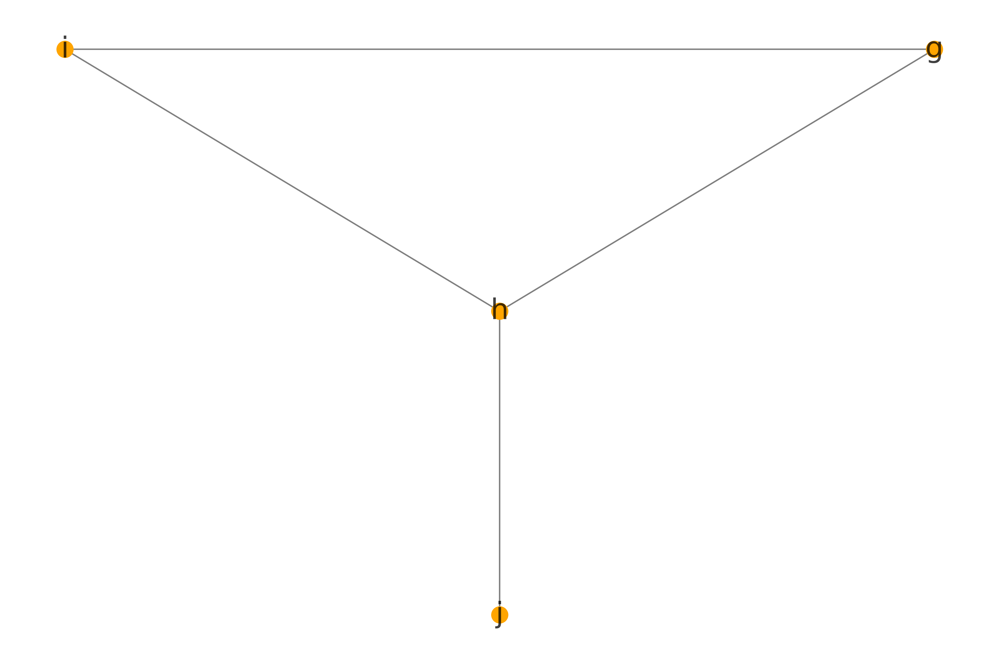

In [218]:
plot_graph(G,10)